In [1]:
## initialization 1120

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import constrNMPy
import os 
import warnings

from matplotlib import gridspec
from scipy import sparse, special, stats

%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action="ignore", category=FutureWarning)

os.chdir('/root/SD_Analysis/Subject_Data')

# color pallette
[gr,ye,re,bl,pu,ir,ak] = ['#8ECFC9', '#FFBE7A', '#FA7F6F', '#82B0D2','#BEB8DC', '#E7DAD2','#999999']
[vio, grb, lig, sil, aqua] = ['#8c84cf','#6699CC','#66CC99','#C0C0C0','#6db3bc']
# set the style of the plots
az.style.use("arviz-white")

def apply_color(value):
    if value < 0.05:
        color = re
    elif value < 0.1:
        color = pu
    else:
        color = '#000000'
    return 'color: %s' % color

# Define criterion & d' function

import scipy.stats as stats
def criterion(hit, FA):
    return -0.5*(stats.norm.ppf(hit) + stats.norm.ppf(FA))

def dprime(hit, FA):
    return (stats.norm.ppf(hit) - stats.norm.ppf(FA))/np.sqrt(2)

def hit_fa(df):
    hit = df[(df['StimSeq'] == 45)]['Accuracy']
    fa = 1 - df[(df['StimSeq'] == -45)]['Accuracy']
    return hit, fa

def hit_fa_motor(df):
    hit = df[(df['StimSeq'] == df['ProbeOriRight'])]['Accuracy']
    fa = 1 - df[(df['StimSeq'] == df['ProbeOriLeft'])]['Accuracy']
    return hit, fa

from statistics import mean, stdev
from math import sqrt

# 1 Load Data & Screening

In [13]:
import random
import pandas as pd
import numpy as np

random.seed(614)

maxsubj = 32
maxblock = 20
maxtrial = 50

# Preload all subject's data
all_data = {iS: [pd.read_excel(f'Subject_{iS}.xlsx', sheet_name=f'Sheet{iB}') for iB in range(1, maxblock + 1)] for iS in range(1, maxsubj + 1)}

In [2]:
os.chdir('/root/SD_Analysis/SD_output')

import dill
# # save data
# with open('./all_data.pkl', 'wb') as f:
#     dill.dump(all_data, f) # dill.dump(obj, file)

# load data
with open('./all_data.pkl', 'rb') as f:
    all_data = dill.load(f)  # obj = dill.load(file)

### 1.1 Draw all the accuracy

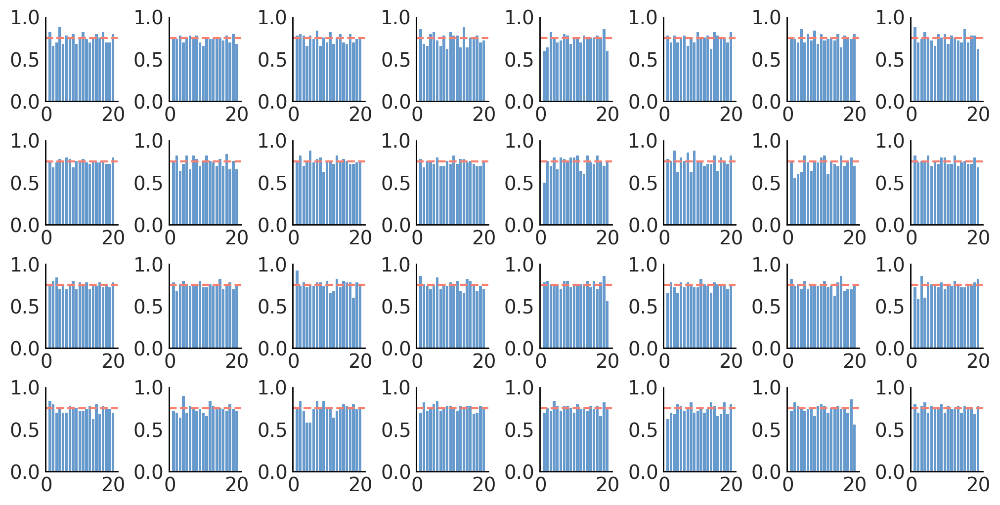

In [3]:
maxsubj = 32; maxblock = 20; maxtrial = 50

plt.figure(figsize=(10, 5))

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # all blocks for this subject
    temp_accuracy = {f"{i}_block": {} for i in range(1, maxblock + 1)}
    for iB in range(1, maxblock + 1):
        key = f"{iB}_block"
        block_data = subject_data[iB - 1]  # read current block
        temp_accuracy[key] = np.mean(block_data['Accuracy'])
    plt.subplot(4, 8, iS)
    plt.bar([int(i.split('_')[0]) for i in temp_accuracy.keys()], temp_accuracy.values(), color=grb)
    plt.ylim([0, 1])
    plt.axhline(y=0.75, color=re, linestyle='--')

### 1.2 Screening Trials Based on RT

16 10 3 16 16 17 11 19 14 12 15 15 18 6 18 13 23 16 8 12 22 16 18 22 14 12 18 16 20 23 9 12 

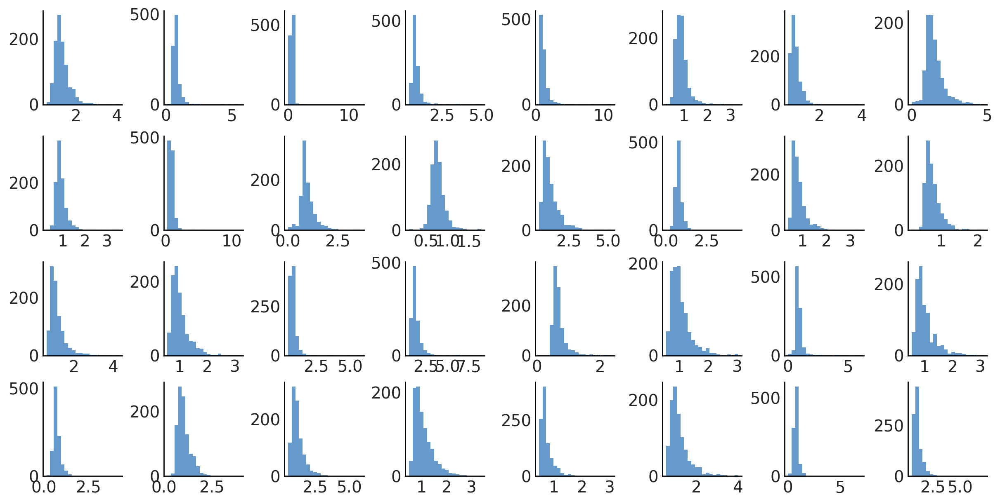

In [4]:
maxsubj = 32; maxblock = 20; maxtrial = 50
plt.figure(figsize=(12, 6))

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # all blocks for this subject
    temp_RT = []
    temp_count = 0
    ## calculate RT mean and SD for each subject
    for iB in range(1, maxblock + 1):
        key = f"{iB}_block"
        block_data = subject_data[iB - 1]  # read current block
        temp_RT.append(block_data['RT'])
    temp_RT = np.concatenate(temp_RT)
    ## Screening data by 3 SD from the mean
    for iB in range(1, maxblock + 1):
        key = f"{iB}_block"
        block_data = subject_data[iB - 1]
        all_data[iS][iB - 1]['Qualified'] = np.logical_and(block_data['RT'] > mean(temp_RT) - 3 * stdev(temp_RT),
                                                           block_data['RT'] < mean(temp_RT) + 3 * stdev(temp_RT))
        temp_count += np.sum(all_data[iS][iB - 1]['Qualified'])
    print(1000 - temp_count, end=' ') 
    plt.subplot(4, 8, iS)
    plt.hist(temp_RT, bins=20, color=grb)
plt.show()

### 1.3 Screening Subjects Based on Threshold  (?)

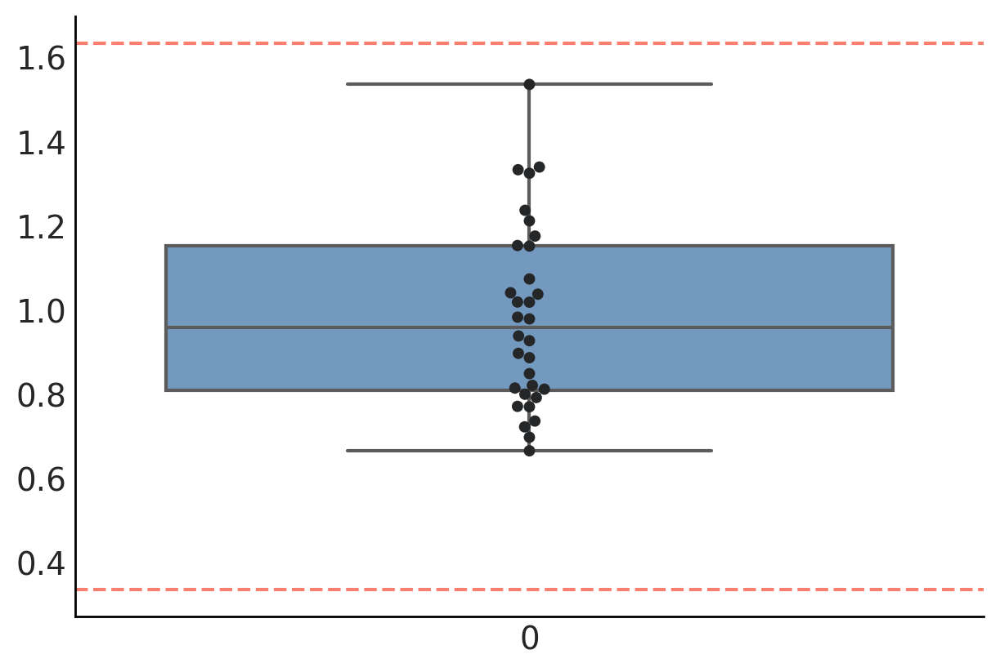

In [8]:
maxsubj = 32; maxblock = 20; maxtrial = 50

all_contrasts = []

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # all blocks for this subject
    temp_contrast = []
    ## calculate contrast mean for each subject
    for iB in range(1, maxblock + 1):
        key = f"{iB}_block"
        block_data = subject_data[iB - 1]  # read current block
        temp_contrast.append(block_data['RT'])
    temp_contrast = np.concatenate(temp_contrast)
    all_contrasts.append(mean(temp_contrast))
all_contrasts = pd.DataFrame(all_contrasts)

plt.figure(figsize=(6, 4))
plt.axhline(y= np.mean(all_contrasts[0]) + 3 * np.std(all_contrasts[0]), color=re, linestyle='--')
plt.axhline(y= np.mean(all_contrasts[0]) - 3 * np.std(all_contrasts[0]), color=re, linestyle='--')
sns.boxplot(data=all_contrasts, color=grb)
sns.swarmplot(data=all_contrasts, color=grb)
plt.show()

# 2 Perceptual SD
### 2.1 SD Artifacts (up to 10 backs)

This is calculated by balancing the keychoices.
Which means that, we calculate the serial dependence effect (criterion shift) for choosing LeftKey & RightKey separately, then average the two SD as the final metric.

In [7]:
import random
random.seed(614)

maxsubj = 32
maxblock = 20
maxtrial = 50
num_backs = 10  # 1-back to 10-back
shuffle_times = 100

def process_data_percept(data, back):
    """Return hits and false alarms"""
    hit_L, fa_L = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['RespLorR'] == -1) & (data['Qualified'] == True)])
    hit_R, fa_R = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['RespLorR'] == 1) & (data['Qualified'] == True)])
    hit_nL, fa_nL = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['RespLorR'] == -1) & (data['Qualified'] == True)])
    hit_nR, fa_nR = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['RespLorR'] == 1) & (data['Qualified'] == True)])
    return (hit_L, fa_L, hit_R, fa_R, hit_nL, fa_nL, hit_nR, fa_nR)

SD_nback_Artifacts = {f"{i}_back": [] for i in range(1, num_backs + 1)}

for iS in range(1, maxsubj + 1):
    SD_nback_Artifacts_i = {f"{i}_back": [] for i in range(1, num_backs + 1)}
    subject_data = all_data[iS]  # Get Subject Data

    for iT in range(shuffle_times):
    # Store nback for subjects
        temp_data = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": [], "Hit_nL": [], "FA_nL": [], "Hit_nR": [], "FA_nR": []} for i in range(1, num_backs + 1)}
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1]  # Get Block Data
            block_data = block_data.sample(frac=1).reset_index(drop=True) # shuffle
            for back in range(1, num_backs + 1):
                hits_fa = process_data_percept(block_data, back)
                temp_data[f"{back}_back"]["Hit_L"].append(hits_fa[0])
                temp_data[f"{back}_back"]["FA_L"].append(hits_fa[1])
                temp_data[f"{back}_back"]["Hit_R"].append(hits_fa[2])
                temp_data[f"{back}_back"]["FA_R"].append(hits_fa[3])
                temp_data[f"{back}_back"]["Hit_nL"].append(hits_fa[4])
                temp_data[f"{back}_back"]["FA_nL"].append(hits_fa[5])
                temp_data[f"{back}_back"]["Hit_nR"].append(hits_fa[6])
                temp_data[f"{back}_back"]["FA_nR"].append(hits_fa[7])

        # Calculate n-back criterion shift and add
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits_L = np.concatenate(temp_data[key]["Hit_L"])
            fas_L = np.concatenate(temp_data[key]["FA_L"])
            hits_R = np.concatenate(temp_data[key]["Hit_R"])
            fas_R = np.concatenate(temp_data[key]["FA_R"])
            hits_nL = np.concatenate(temp_data[key]["Hit_nL"])
            fas_nL = np.concatenate(temp_data[key]["FA_nL"])
            hits_nR = np.concatenate(temp_data[key]["Hit_nR"])
            fas_nR = np.concatenate(temp_data[key]["FA_nR"])
            cs_L = - criterion(np.mean(hits_L), np.mean(fas_L)) + criterion(np.mean(hits_nL), np.mean(fas_nL))
            cs_R = - criterion(np.mean(hits_R), np.mean(fas_R)) + criterion(np.mean(hits_nR), np.mean(fas_nR))
            SD_nback_Artifacts_i[key].append(np.mean([cs_L, cs_R]))
        if ((iT+1)%10) == 0:
            print('', end="!")

    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        SD_nback_Artifacts[key].append(np.mean(SD_nback_Artifacts_i[key]))
    
    print('done ', end="@")

SD_nbacks_Artifacts = pd.DataFrame(SD_nback_Artifacts)
SD_nbacks_Artifacts.head()

# with open('./SD_Perceptual_Artifacts.pkl', 'wb') as f:
#     dill.dump(SD_nbacks_Artifacts, f) # dill.dump(obj, file)

!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @

In [6]:
# load data
with open('./SD_Perceptual_Artifacts.pkl', 'rb') as f:
    SD_nbacks_Artifacts= dill.load(f)  # obj = dill.load(file)
SD_nbacks_Artifacts.head()

,1_back,2_back,3_back,4_back,5_back,6_back,7_back,8_back,9_back,10_back
0,-0.170819,-0.178191,-0.166206,-0.155560,-0.167535,-0.164890,-0.160728,-0.168885,-0.173470,-0.162241
1,-0.010183,-0.013151,-0.015415,-0.006096,-0.034570,-0.006019,-0.003219,-0.015110,-0.012167,-0.007297
2,-0.065179,-0.066042,-0.073881,-0.056663,-0.062034,-0.059684,-0.060468,-0.062713,-0.057108,-0.068155
3,-0.217299,-0.216412,-0.223328,-0.229809,-0.221018,-0.231743,-0.226944,-0.230259,-0.232933,-0.238921
4,-0.276914,-0.252527,-0.274872,-0.261115,-0.281952,-0.260959,-0.262597,-0.244170,-0.256744,-0.258447


### 2.2 Pure Perceptual SD

In [20]:
maxsubj = 32; maxblock = 20; maxtrial = 50; num_backs = 10  # n-backs

# all data from nbacks
SD_nback_Percept = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Percept_45 = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Percept_n45 = {f"{i}_back": [] for i in range(1, num_backs + 1)}

def process_data_percept(data, back):
    """Return hits and false alarms"""
    hit_L, fa_L = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['RespLorR'] == -1) & (data['Qualified'] == True)])
    hit_R, fa_R = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['RespLorR'] == 1) & (data['Qualified'] == True)])
    hit_nL, fa_nL = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['RespLorR'] == -1) & (data['Qualified'] == True)])
    hit_nR, fa_nR = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['RespLorR'] == 1) & (data['Qualified'] == True)])
    return (hit_L, fa_L, hit_R, fa_R, hit_nL, fa_nL, hit_nR, fa_nR)

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get Subject Data
    temp_data = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": [], "Hit_nL": [], "FA_nL": [], "Hit_nR": [], "FA_nR": []} for i in range(1, num_backs + 1)}

    for iB in range(1, maxblock + 1):
        for back in range(1, num_backs + 1):
            block_data = subject_data[iB - 1]  # Get Block data
            hits_fa = process_data_percept(block_data, back)
            temp_data[f"{back}_back"]["Hit_L"].append(hits_fa[0])
            temp_data[f"{back}_back"]["FA_L"].append(hits_fa[1])
            temp_data[f"{back}_back"]["Hit_R"].append(hits_fa[2])
            temp_data[f"{back}_back"]["FA_R"].append(hits_fa[3])
            temp_data[f"{back}_back"]["Hit_nL"].append(hits_fa[4])
            temp_data[f"{back}_back"]["FA_nL"].append(hits_fa[5])
            temp_data[f"{back}_back"]["Hit_nR"].append(hits_fa[6])
            temp_data[f"{back}_back"]["FA_nR"].append(hits_fa[7])

    # Calculate SD and Add to the SD_nback_Percept
    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        hits_L = np.concatenate(temp_data[key]["Hit_L"])
        fas_L = np.concatenate(temp_data[key]["FA_L"])
        hits_R = np.concatenate(temp_data[key]["Hit_R"])
        fas_R = np.concatenate(temp_data[key]["FA_R"])
        hits_nL = np.concatenate(temp_data[key]["Hit_nL"])
        fas_nL = np.concatenate(temp_data[key]["FA_nL"])
        hits_nR = np.concatenate(temp_data[key]["Hit_nR"])
        fas_nR = np.concatenate(temp_data[key]["FA_nR"])
        # temp_var = [np.mean(hits_L), np.mean(fas_L), np.mean(hits_R), np.mean(fas_R), np.mean(hits_nL), np.mean(fas_nL), np.mean(hits_nR), np.mean(fas_nR)]
        # if 0 in temp_var:
        #     print('warning 0:','Subj_',iS,temp_var[temp_var.index(0)])
        # elif 1 in temp_var:
        #     print('warning 1:', 'Subj_',iS,temp_var[temp_var.index(1)])
        criterion_Percept_45[key].append(np.mean([criterion(np.mean(hits_L), np.mean(fas_L)), criterion(np.mean(hits_R), np.mean(fas_R))]))
        criterion_Percept_n45[key].append(np.mean([criterion(np.mean(hits_nL), np.mean(fas_nL)), criterion(np.mean(hits_nR), np.mean(fas_nR))]))
        cs_L = criterion(np.mean(hits_nL), np.mean(fas_nL)) - criterion(np.mean(hits_L), np.mean(fas_L)) 
        cs_R = criterion(np.mean(hits_nR), np.mean(fas_nR)) - criterion(np.mean(hits_R), np.mean(fas_R))
        SD_nback_Percept[key].append(np.mean([cs_L, cs_R]))
    
    print('done ', end="@")

SD_nbacks_Percept = pd.DataFrame(SD_nback_Percept)
criterion_Percept_45 = pd.DataFrame(criterion_Percept_45)
criterion_Percept_n45 = pd.DataFrame(criterion_Percept_n45)
SD_nbacks_Percept.head()



done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

,1_back,2_back,3_back,4_back,5_back,6_back,7_back,8_back,9_back,10_back
0,0.494421,0.611908,0.471037,0.564717,0.553626,0.350244,0.346579,0.333891,0.374630,0.321317
1,0.153155,0.114973,0.015544,0.098353,0.089289,0.068621,0.024033,-0.142426,0.122631,0.086115
2,0.224048,0.286464,0.273054,0.293799,0.132518,0.192068,0.052690,0.184542,0.102595,0.277932
3,0.463312,0.378388,0.457099,0.371831,0.198258,0.390125,0.157210,0.314857,0.446657,0.166896
4,0.337635,0.489496,0.367704,0.529313,0.421380,0.536554,0.470525,0.341536,0.396584,0.244771


In [21]:
with open('./SD_Perceptual_balance_keys_averaged.pkl', 'wb') as f:
    dill.dump([SD_nbacks_Percept,criterion_Percept_45, criterion_Percept_n45], f) # dill.dump(obj, file)

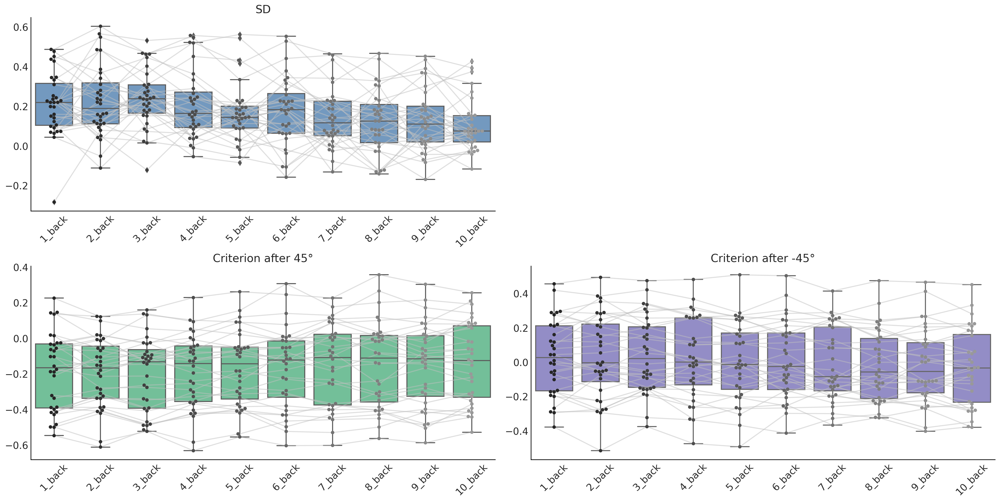

In [8]:
plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plt.title('SD')
sns.boxplot(data=SD_nbacks_Percept, color=grb)
sns.swarmplot(data=SD_nbacks_Percept, color=ak)
for i in range(32):
    plt.plot(np.arange(0, 10), SD_nbacks_Percept.iloc[i, :], color=sil, alpha=0.5)
plt.xticks(rotation=45)
plt.subplot(2, 2, 3)
plt.title('Criterion after 45°')
sns.boxplot(data=criterion_Percept_45, color=lig)
sns.swarmplot(data=criterion_Percept_45, color=ak)
for i in range(32):
    plt.plot(np.arange(0, 10), criterion_Percept_45.iloc[i, :], color=sil, alpha=0.5)
plt.xticks(rotation=45)
plt.subplot(2, 2, 4)
plt.title('Criterion after -45°')
sns.boxplot(data=criterion_Percept_n45, color=vio)
sns.swarmplot(data=criterion_Percept_n45, color=ak)
for i in range(32):
    plt.plot(np.arange(0, 10), criterion_Percept_n45.iloc[i, :], color=sil, alpha=0.5)
plt.xticks(rotation=45)
plt.show()

### 2.3 Adding Feedback

In [25]:
maxsubj = 32 ;maxblock = 20 ;maxtrial = 50 ;num_backs = 10  # 1-back to 10-back

# Dictionary to store data for different back levels
SD_back_Percept_Y = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
SD_back_Percept_N = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)
criterion_Percept_Y_45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
criterion_Percept_N_45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)
criterion_Percept_Y_n45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
criterion_Percept_N_n45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)

def process_data_percept_FB(data, back, feedback):
    """Process data and return hits and false alarms"""
    hit_L, fa_L = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['RespLorR'] == -1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_R, fa_R = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['RespLorR'] == 1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_nL, fa_nL = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['RespLorR'] == -1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_nR, fa_nR = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['RespLorR'] == 1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    return (hit_L, fa_L, hit_R, fa_R, hit_nL, fa_nL, hit_nR, fa_nR)

FB_types = [1, 0]  # 1: correct feedback; 0: incorrect feedback

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    
    # Create a temporary dictionary to store data for each back level
    temp_data_Y = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": [], "Hit_nL": [], "FA_nL": [], "Hit_nR": [], "FA_nR": []} for i in range(1, num_backs + 1)}
    temp_data_N = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": [], "Hit_nL": [], "FA_nL": [], "Hit_nR": [], "FA_nR": []} for i in range(1, num_backs + 1)}
    temp_data = {1: temp_data_Y, 0: temp_data_N}
    
    for iFB in FB_types:
        feedback = iFB
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1] # Get data for the current block
            for back in range(1, num_backs + 1):
                hits_fa = process_data_percept_FB(block_data, back, feedback)
                temp_data[feedback][f"{back}_back"]["Hit_L"].append(hits_fa[0])
                temp_data[feedback][f"{back}_back"]["FA_L"].append(hits_fa[1])
                temp_data[feedback][f"{back}_back"]["Hit_R"].append(hits_fa[2])
                temp_data[feedback][f"{back}_back"]["FA_R"].append(hits_fa[3])
                temp_data[feedback][f"{back}_back"]["Hit_nL"].append(hits_fa[4])
                temp_data[feedback][f"{back}_back"]["FA_nL"].append(hits_fa[5])
                temp_data[feedback][f"{back}_back"]["Hit_nR"].append(hits_fa[6])
                temp_data[feedback][f"{back}_back"]["FA_nR"].append(hits_fa[7])

    # Calculate the criterion score for each back level and add it to SD_back_Percept_Y and SD_back_Percept_N
    for iFB in FB_types:
        feedback = iFB
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits_L = np.concatenate(temp_data[feedback][key]["Hit_L"])
            fas_L = np.concatenate(temp_data[feedback][key]["FA_L"])
            hits_R = np.concatenate(temp_data[feedback][key]["Hit_R"])
            fas_R = np.concatenate(temp_data[feedback][key]["FA_R"])
            hits_nL = np.concatenate(temp_data[feedback][key]["Hit_nL"])
            fas_nL = np.concatenate(temp_data[feedback][key]["FA_nL"])
            hits_nR = np.concatenate(temp_data[feedback][key]["Hit_nR"])
            fas_nR = np.concatenate(temp_data[feedback][key]["FA_nR"])
            cri_L = criterion(np.mean(hits_L)*0.99+0.005, np.mean(fas_L)*0.99+0.005)
            cri_R = criterion(np.mean(hits_R)*0.99+0.005, np.mean(fas_R)*0.99+0.005)
            cri_nL = criterion(np.mean(hits_nL)*0.99+0.005, np.mean(fas_nL)*0.99+0.005)
            cri_nR = criterion(np.mean(hits_nR)*0.99+0.005, np.mean(fas_nR)*0.99+0.005)
            cri_45 = np.mean([cri_L, cri_R])
            cri_n45 = np.mean([cri_nL, cri_nR])
            SD_back_percept = np.mean([cri_nL - cri_L, cri_nR - cri_R])
            if feedback == 1:
                SD_back_Percept_Y[key].append(SD_back_percept)
                criterion_Percept_Y_45[key].append(cri_45)
                criterion_Percept_Y_n45[key].append(cri_n45)
            else:
                SD_back_Percept_N[key].append(SD_back_percept)
                criterion_Percept_N_45[key].append(cri_45)
                criterion_Percept_N_n45[key].append(cri_n45)
    print('done ', end="@")

SD_nbacks_Percept_Y = pd.DataFrame(SD_back_Percept_Y)
SD_nbacks_Percept_N = pd.DataFrame(SD_back_Percept_N)
criterion_nbacks_Percept_Y_45 = pd.DataFrame(criterion_Percept_Y_45)
criterion_nbacks_Percept_Y_n45 = pd.DataFrame(criterion_Percept_Y_n45)
criterion_nbacks_Percept_N_45 = pd.DataFrame(criterion_Percept_N_45)
criterion_nbacks_Percept_N_n45 = pd.DataFrame(criterion_Percept_N_n45)

done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

In [26]:
with open('./SD_Perceptual_balance_keys_FB.pkl', 'wb') as f:
    dill.dump([SD_nbacks_Percept_Y, criterion_nbacks_Percept_Y_45, criterion_nbacks_Percept_Y_n45,
               SD_nbacks_Percept_N, criterion_nbacks_Percept_N_45, criterion_nbacks_Percept_N_n45], f) # dill.dump(obj, file)

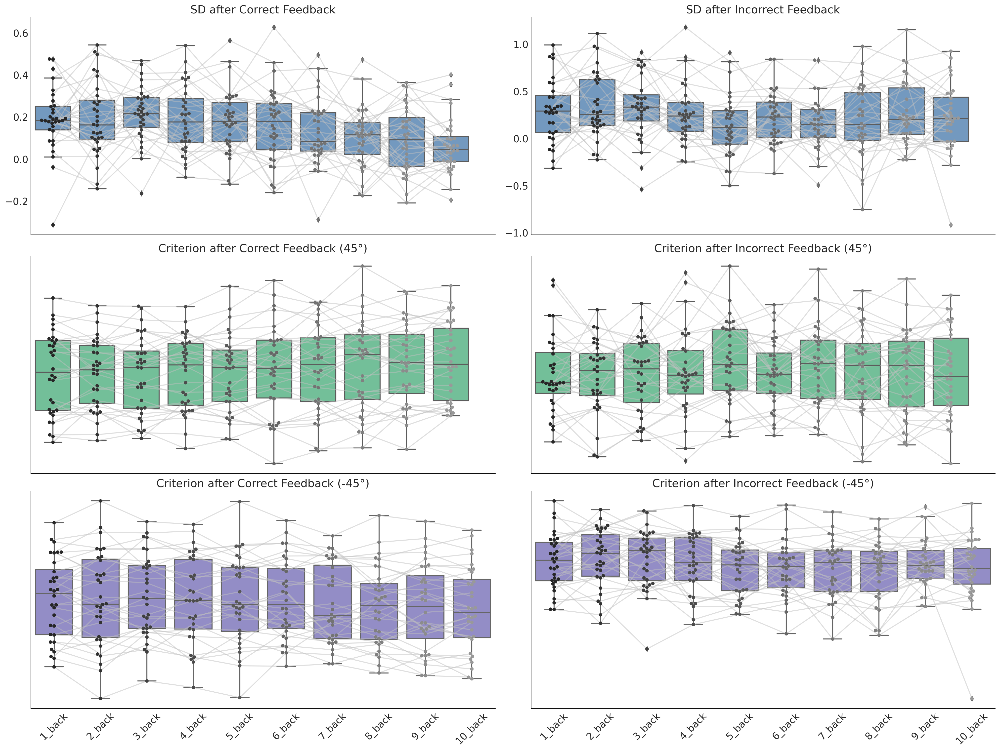

In [10]:
fig, axes = plt.subplots(3, 2, figsize=(20,15), dpi = 100)

axes[0, 0].set_title('SD after Correct Feedback')
sns.boxplot(data=SD_nbacks_Percept_Y, color=grb, ax=axes[0, 0])
sns.swarmplot(data=SD_nbacks_Percept_Y, color=ak, ax=axes[0, 0])
for i in range(32):
    axes[0, 0].plot(np.arange(0, 10), SD_nbacks_Percept_Y.iloc[i, :], color=sil, alpha=0.5)
axes[0, 0].set_xticks('')
axes[0, 0].set_xticklabels('')
axes[0, 0].set_xlabel('')

axes[0, 1].set_title('SD after Incorrect Feedback')
sns.boxplot(data=SD_nbacks_Percept_N, color=grb, ax=axes[0, 1])
sns.swarmplot(data=SD_nbacks_Percept_N, color=ak, ax=axes[0, 1])
for i in range(32):
    axes[0, 1].plot(np.arange(0, 10), SD_nbacks_Percept_N.iloc[i, :], color=sil, alpha=0.5)
axes[0, 1].set_xticks('')
axes[0, 1].set_xticklabels('')
axes[0, 1].set_xlabel('')

axes[1, 0].set_title('Criterion after Correct Feedback (45°)')
sns.boxplot(data=criterion_nbacks_Percept_Y_45, color=lig, ax=axes[1, 0])
sns.swarmplot(data=criterion_nbacks_Percept_Y_45, color=ak, ax=axes[1, 0])
for i in range(32):
    axes[1, 0].plot(np.arange(0, 10), criterion_nbacks_Percept_Y_45.iloc[i, :], color=sil, alpha=0.5)   
axes[1, 0].set_xticks('')
axes[1, 0].set_xticklabels('')
axes[1, 0].set_xlabel('')
axes[1, 0].set_ylabel('')
axes[1, 0].set_yticklabels('')

axes[1, 1].set_title('Criterion after Incorrect Feedback (45°)')
sns.boxplot(data=criterion_nbacks_Percept_N_45, color=lig, ax=axes[1, 1])
sns.swarmplot(data=criterion_nbacks_Percept_N_45, color=ak, ax=axes[1, 1])
for i in range(32):
    axes[1, 1].plot(np.arange(0, 10), criterion_nbacks_Percept_N_45.iloc[i, :], color=sil, alpha=0.5)
axes[1, 1].set_xticks('')
axes[1, 1].set_xticklabels('')
axes[1, 1].set_xlabel('')
axes[1, 1].set_ylabel('')
axes[1, 1].set_yticklabels('')

axes[2, 0].set_title('Criterion after Correct Feedback (-45°)')
sns.boxplot(data=criterion_nbacks_Percept_Y_n45, color=vio, ax=axes[2, 0])
sns.swarmplot(data=criterion_nbacks_Percept_Y_n45, color=ak, ax=axes[2, 0])
for i in range(32):
    axes[2, 0].plot(np.arange(0, 10), criterion_nbacks_Percept_Y_n45.iloc[i, :], color=sil, alpha=0.5)
axes[2, 0].set_xticklabels(labels = ['1_back', '2_back', '3_back', '4_back', '5_back', '6_back', '7_back', '8_back', '9_back', '10_back'], rotation = 45)
axes[2, 0].set_yticklabels('')

axes[2, 1].set_title('Criterion after Incorrect Feedback (-45°)')
sns.boxplot(data=criterion_nbacks_Percept_N_n45, color=vio, ax=axes[2, 1])
sns.swarmplot(data=criterion_nbacks_Percept_N_n45, color=ak, ax=axes[2, 1])
for i in range(32):
    axes[2, 1].plot(np.arange(0, 10), criterion_nbacks_Percept_N_n45.iloc[i, :], color=sil, alpha=0.5)
plt.xticks(rotation=45)
axes[2, 1].set_yticklabels('')

plt.show()


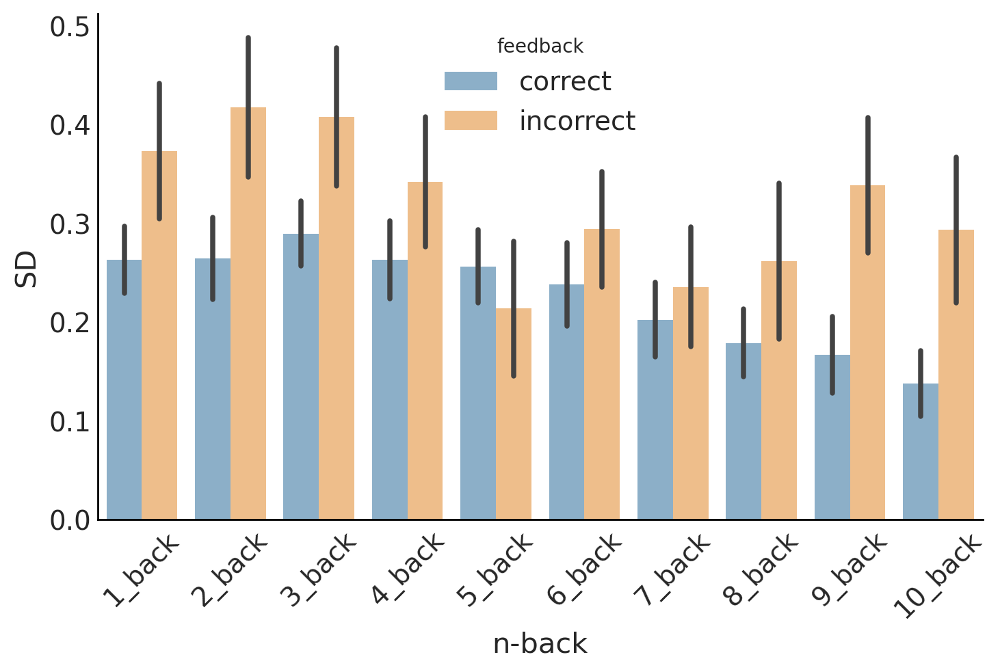

In [16]:
SD_nbacks_Percept_Y = pd.DataFrame(SD_back_Percept_Y)
SD_nbacks_Percept_N = pd.DataFrame(SD_back_Percept_N)
# SD_nbacks_Percept_Y.index = np.arange(1, 33)
# SD_nbacks_Percept_N.index = np.arange(1, 33)
SD_Perceptual_Artifacts = SD_nbacks_Artifacts.copy()
df1 = SD_nbacks_Percept_Y - SD_Perceptual_Artifacts
df2 = SD_nbacks_Percept_N - SD_Perceptual_Artifacts
df1['feedback'] = 'correct'
df2['feedback'] = 'incorrect'
df = pd.concat([df1, df2])
df = df.melt(id_vars=['feedback'], var_name='n-back', value_name='SD')
sns.barplot(x='n-back', y='SD', hue='feedback', data=df, errorbar='se', palette = [bl, ye])
plt.xticks(rotation = 45)
plt.show()

# 2II Perceptual SD (combining keychoices) 
### 2.1 SD Artifacts (up to 10 backs)

This is calculated by combining the keychoices.
In this way, all trials with Leftkey and Rightkey choices are combined to enlarge the trials size.

In [32]:
import random
random.seed(614)

maxsubj = 32
maxblock = 20
maxtrial = 50
num_backs = 10  # 1-back to 10-back
shuffle_times = 100

def process_data_percept_cb(data, back):
    """Return hits and false alarms"""
    hit, fa = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['Qualified'] == True)])
    hit_n, fa_n = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['Qualified'] == True)])
    return (hit, fa, hit_n, fa_n)

SD_nback_Artifacts_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}

for iS in range(1, maxsubj + 1):
    SD_nback_Artifacts_i = {f"{i}_back": [] for i in range(1, num_backs + 1)}
    subject_data = all_data[iS]  # Get Subject Data

    for iT in range(shuffle_times):
    # Store nback for subjects
        temp_data = {f"{i}_back": {"Hit": [], "FA": [], "Hit_n": [], "FA_n": []} for i in range(1, num_backs + 1)}
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1]  # Get Block Data
            block_data = block_data.sample(frac=1).reset_index(drop=True) # shuffle
            for back in range(1, num_backs + 1):
                hits_fa = process_data_percept_cb(block_data, back)
                temp_data[f"{back}_back"]["Hit"].append(hits_fa[0])
                temp_data[f"{back}_back"]["FA"].append(hits_fa[1])
                temp_data[f"{back}_back"]["Hit_n"].append(hits_fa[2])
                temp_data[f"{back}_back"]["FA_n"].append(hits_fa[3])

        # Calculate n-back criterion shift and add
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits = np.concatenate(temp_data[key]["Hit"])
            fas = np.concatenate(temp_data[key]["FA"])
            hits_n = np.concatenate(temp_data[key]["Hit_n"])
            fas_n = np.concatenate(temp_data[key]["FA_n"])
            cs = criterion(np.mean(hits_n), np.mean(fas_n)) - criterion(np.mean(hits), np.mean(fas))
            SD_nback_Artifacts_i[key].append(cs)
        print('', end="!")

    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        SD_nback_Artifacts_cb[key].append(np.mean(SD_nback_Artifacts_i[key]))
    print('done ', end="@")

print('1 back', '2 back', '3 back', '4 back', '5 back', '6 back', '7 back', '8 back', '9 back', '10 back')
SD_nbacks_Artifacts_cb = pd.DataFrame(SD_nback_Artifacts_cb)
SD_nbacks_Artifacts_cb.head()

with open('./SD_Perceptual_Artifacts_cb.pkl', 'wb') as f:
    dill.dump(SD_nbacks_Artifacts_cb, f) # dill.dump(obj, file)

!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!done @!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

### 2.2 Pure Perceptual SD

In [27]:
maxsubj = 32; maxblock = 20; maxtrial = 50; num_backs = 10  # n-backs

# all data from nbacks
SD_nback_Percept_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Percept_45_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Percept_n45_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}

def process_data_percept_cb(data, back):
    """Return hits and false alarms"""
    hit, fa = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['Qualified'] == True)])
    hit_n, fa_n = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['Qualified'] == True)])
    return (hit, fa, hit_n, fa_n)

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get Subject Data
    temp_data = {f"{i}_back": {"Hit": [], "FA": [], "Hit_n": [], "FA_n": []} for i in range(1, num_backs + 1)}

    for iB in range(1, maxblock + 1):
        for back in range(1, num_backs + 1):
            block_data = subject_data[iB - 1]  # Get Block data
            hits_fa = process_data_percept_cb(block_data, back)
            temp_data[f"{back}_back"]["Hit"].append(hits_fa[0])
            temp_data[f"{back}_back"]["FA"].append(hits_fa[1])
            temp_data[f"{back}_back"]["Hit_n"].append(hits_fa[2])
            temp_data[f"{back}_back"]["FA_n"].append(hits_fa[3])

    # Calculate SD and Add to the SD_nback_Percept
    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        hits = np.concatenate(temp_data[key]["Hit"])
        fas = np.concatenate(temp_data[key]["FA"])
        hits_n = np.concatenate(temp_data[key]["Hit_n"])
        fas_n = np.concatenate(temp_data[key]["FA_n"])
        # temp_var = [np.mean(hits_L), np.mean(fas_L), np.mean(hits_R), np.mean(fas_R), np.mean(hits_nL), np.mean(fas_nL), np.mean(hits_nR), np.mean(fas_nR)]
        # if 0 in temp_var:
        #     print('warning 0:','Subj_',iS,temp_var[temp_var.index(0)])
        # elif 1 in temp_var:
        #     print('warning 1:', 'Subj_',iS,temp_var[temp_var.index(1)])
        criterion_Percept_45_cb[key].append(criterion(np.mean(hits), np.mean(fas)))
        criterion_Percept_n45_cb[key].append(criterion(np.mean(hits_n), np.mean(fas_n)))
        cs = criterion(np.mean(hits_n), np.mean(fas_n)) - criterion(np.mean(hits), np.mean(fas))
        SD_nback_Percept_cb[key].append(cs)
    
    print('done ', end="@")

SD_nbacks_Percept_cb = pd.DataFrame(SD_nback_Percept_cb)
criterion_Percept_45_cb = pd.DataFrame(criterion_Percept_45_cb)
criterion_Percept_n45_cb = pd.DataFrame(criterion_Percept_n45_cb)
SD_nbacks_Percept_cb.head()

done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

,1_back,2_back,3_back,4_back,5_back,6_back,7_back,8_back,9_back,10_back
0,0.488630,0.610101,0.467714,0.563316,0.540183,0.351655,0.350105,0.325058,0.367391,0.312030
1,0.164427,0.091090,-0.001577,0.099079,0.053191,0.087745,0.019304,-0.064210,0.128343,0.065879
2,0.170704,0.308357,0.261046,0.271015,0.098788,0.222764,0.059496,0.178219,0.127507,0.284052
3,0.461782,0.375649,0.471429,0.384992,0.196996,0.398123,0.164449,0.309238,0.427135,0.166527
4,0.357632,0.509984,0.395031,0.545642,0.452004,0.492586,0.451530,0.378623,0.424980,0.273172


In [28]:
with open('./SD_Perceptual_combined_averaged.pkl', 'wb') as f:
    dill.dump([SD_nbacks_Percept_cb,criterion_Percept_45_cb, criterion_Percept_n45_cb], f) # dill.dump(obj, file)

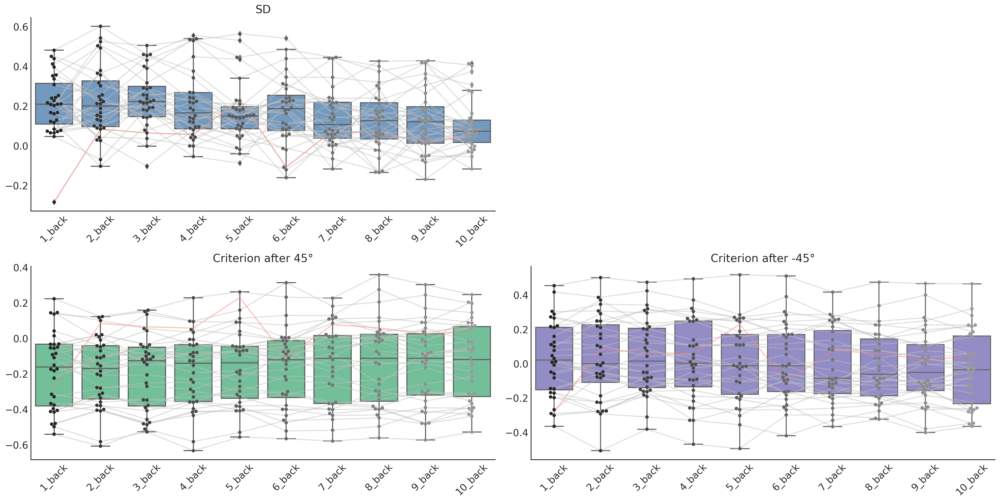

In [20]:

plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plt.title('SD')
sns.boxplot(data=SD_nbacks_Percept_cb, color=grb)
sns.swarmplot(data=SD_nbacks_Percept_cb, color=ak)
for i in range(32):
    plt.plot(np.arange(0, 10), SD_nbacks_Percept_cb.iloc[i, :], color=sil, alpha=0.5)
    if i == 12:
        plt.plot(np.arange(0, 10), SD_nbacks_Percept_cb.iloc[i, :], color=re, alpha=0.5)
plt.xticks(rotation=45)
plt.subplot(2, 2, 3)
plt.title('Criterion after 45°')
sns.boxplot(data=criterion_Percept_45_cb, color=lig)
sns.swarmplot(data=criterion_Percept_45_cb, color=ak)
for i in range(32):
    plt.plot(np.arange(0, 10), criterion_Percept_45_cb.iloc[i, :], color=sil, alpha=0.5)
    if i == 12:
        plt.plot(np.arange(0, 10), SD_nbacks_Percept_cb.iloc[i, :], color=re, alpha=0.5)
plt.xticks(rotation=45)
plt.subplot(2, 2, 4)
plt.title('Criterion after -45°')
sns.boxplot(data=criterion_Percept_n45_cb, color=vio)
sns.swarmplot(data=criterion_Percept_n45_cb, color=ak)
for i in range(32):
    plt.plot(np.arange(0, 10), criterion_Percept_n45_cb.iloc[i, :], color=sil, alpha=0.5)
    if i == 12:
        plt.plot(np.arange(0, 10), SD_nbacks_Percept_cb.iloc[i, :], color=re, alpha=0.5)
plt.xticks(rotation=45)
plt.show()

### 2.3 Adding Feedback

In [30]:
maxsubj = 32 ;maxblock = 20 ;maxtrial = 50 ;num_backs = 10  # 1-back to 10-back

# Dictionary to store data for different back levels
SD_back_Percept_Y_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
SD_back_Percept_N_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)
criterion_Percept_Y_45_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
criterion_Percept_N_45_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)
criterion_Percept_Y_n45_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
criterion_Percept_N_n45_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)

def process_data_percept_FB_cb(data, back, feedback):
    """Process data and return hits and false alarms"""
    hit, fa = hit_fa(data[(data['RespOri'].shift(back) == 45) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_n, fa_n = hit_fa(data[(data['RespOri'].shift(back) == -45) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    return (hit, fa, hit_n, fa_n)

FB_types = [1, 0]  # 1: correct feedback; 0: incorrect feedback

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    
    # Create a temporary dictionary to store data for each back level
    temp_data_Y = {f"{i}_back": {"Hit": [], "FA": [], "Hit_n": [], "FA_n": []} for i in range(1, num_backs + 1)}
    temp_data_N = {f"{i}_back": {"Hit": [], "FA": [], "Hit_n": [], "FA_n": []} for i in range(1, num_backs + 1)}
    temp_data = {1: temp_data_Y, 0: temp_data_N}
    
    for iFB in FB_types:
        feedback = iFB
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1] # Get data for the current block
            for back in range(1, num_backs + 1):
                hits_fa = process_data_percept_FB_cb(block_data, back, feedback)
                temp_data[feedback][f"{back}_back"]["Hit"].append(hits_fa[0])
                temp_data[feedback][f"{back}_back"]["FA"].append(hits_fa[1])
                temp_data[feedback][f"{back}_back"]["Hit_n"].append(hits_fa[2])
                temp_data[feedback][f"{back}_back"]["FA_n"].append(hits_fa[3])

    # Calculate the criterion score for each back level and add it to SD_back_Percept_Y and SD_back_Percept_N
    for iFB in FB_types:
        feedback = iFB
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits = np.concatenate(temp_data[feedback][key]["Hit"])
            fas = np.concatenate(temp_data[feedback][key]["FA"])
            hits_n = np.concatenate(temp_data[feedback][key]["Hit_n"])
            fas_n = np.concatenate(temp_data[feedback][key]["FA_n"])
            cri_45 = criterion(np.mean(hits), np.mean(fas))
            cri_n45 = criterion(np.mean(hits_n), np.mean(fas_n))
            SD_back_percept = cri_n45 - cri_45
#             temp_output = {'h':format(np.mean(hits),}
#             print(iFB, '_', key, ' :: ', temp_output)
            if feedback == 1:
                SD_back_Percept_Y_cb[key].append(SD_back_percept)
                criterion_Percept_Y_45_cb[key].append(cri_45)
                criterion_Percept_Y_n45_cb[key].append(cri_n45)
            else:
                SD_back_Percept_N_cb[key].append(SD_back_percept)
                criterion_Percept_N_45_cb[key].append(cri_45)
                criterion_Percept_N_n45_cb[key].append(cri_n45)
    print('done ', end="@")

SD_nbacks_Percept_Y_cb = pd.DataFrame(SD_back_Percept_Y_cb)
SD_nbacks_Percept_N_cb = pd.DataFrame(SD_back_Percept_N_cb)
criterion_nbacks_Percept_Y_45_cb = pd.DataFrame(criterion_Percept_Y_45_cb)
criterion_nbacks_Percept_Y_n45_cb = pd.DataFrame(criterion_Percept_Y_n45_cb)
criterion_nbacks_Percept_N_45_cb = pd.DataFrame(criterion_Percept_N_45_cb)
criterion_nbacks_Percept_N_n45_cb = pd.DataFrame(criterion_Percept_N_n45_cb)

done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

In [31]:
with open('./SD_Perceptual_combined_FB.pkl', 'wb') as f:
    dill.dump([SD_nbacks_Percept_Y_cb, criterion_nbacks_Percept_Y_45_cb, criterion_nbacks_Percept_Y_n45_cb,
               SD_nbacks_Percept_N_cb, criterion_nbacks_Percept_N_45_cb, criterion_nbacks_Percept_N_n45_cb], f) # dill.dump(obj, file)

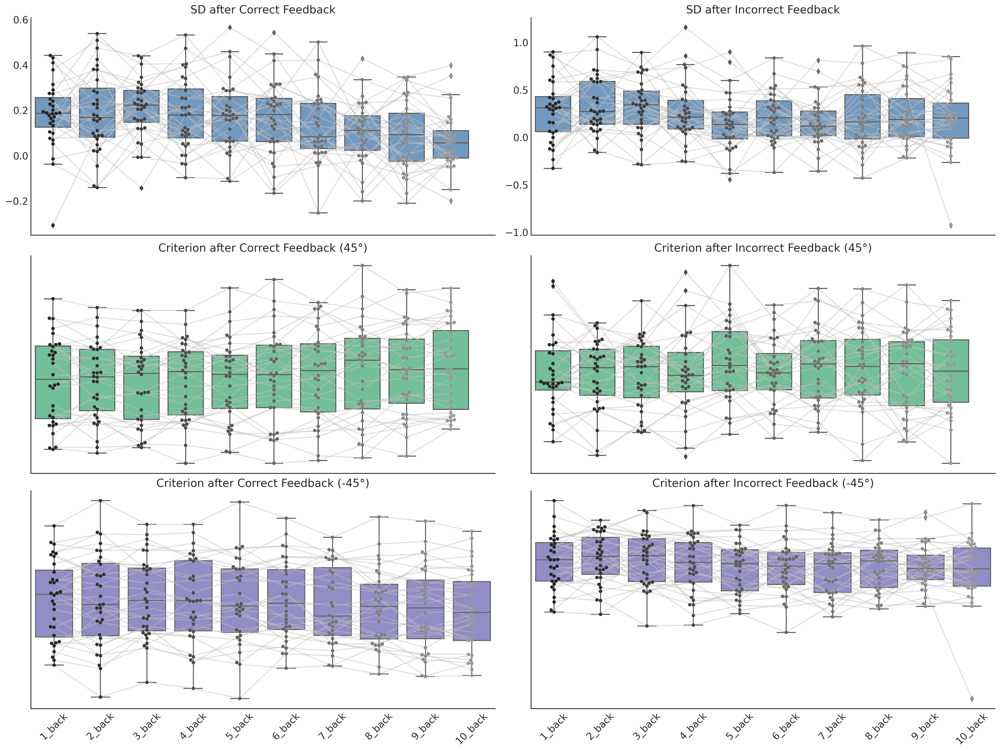

In [6]:
fig, axes = plt.subplots(3, 2, figsize=(20,15), dpi = 100)

axes[0, 0].set_title('SD after Correct Feedback')
sns.boxplot(data=SD_nbacks_Percept_Y_cb, color=grb, ax=axes[0, 0])
sns.swarmplot(data=SD_nbacks_Percept_Y_cb, color=ak, ax=axes[0, 0])
for i in range(32):
    axes[0, 0].plot(np.arange(0, 10), SD_nbacks_Percept_Y_cb.iloc[i, :], color=sil, alpha=0.5)
axes[0, 0].set_xticks('')
axes[0, 0].set_xticklabels('')
axes[0, 0].set_xlabel('')

axes[0, 1].set_title('SD after Incorrect Feedback')
sns.boxplot(data=SD_nbacks_Percept_N_cb, color=grb, ax=axes[0, 1])
sns.swarmplot(data=SD_nbacks_Percept_N_cb, color=ak, ax=axes[0, 1])
for i in range(32):
    axes[0, 1].plot(np.arange(0, 10), SD_nbacks_Percept_N_cb.iloc[i, :], color=sil, alpha=0.5)
axes[0, 1].set_xticks('')
axes[0, 1].set_xticklabels('')
axes[0, 1].set_xlabel('')

axes[1, 0].set_title('Criterion after Correct Feedback (45°)')
sns.boxplot(data=criterion_nbacks_Percept_Y_45_cb, color=lig, ax=axes[1, 0])
sns.swarmplot(data=criterion_nbacks_Percept_Y_45_cb, color=ak, ax=axes[1, 0])
for i in range(32):
    axes[1, 0].plot(np.arange(0, 10), criterion_nbacks_Percept_Y_45_cb.iloc[i, :], color=sil, alpha=0.5)   
axes[1, 0].set_xticks('')
axes[1, 0].set_xticklabels('')
axes[1, 0].set_xlabel('')
axes[1, 0].set_ylabel('')
axes[1, 0].set_yticklabels('')

axes[1, 1].set_title('Criterion after Incorrect Feedback (45°)')
sns.boxplot(data=criterion_nbacks_Percept_N_45_cb, color=lig, ax=axes[1, 1])
sns.swarmplot(data=criterion_nbacks_Percept_N_45_cb, color=ak, ax=axes[1, 1])
for i in range(32):
    axes[1, 1].plot(np.arange(0, 10), criterion_nbacks_Percept_N_45_cb.iloc[i, :], color=sil, alpha=0.5)
axes[1, 1].set_xticks('')
axes[1, 1].set_xticklabels('')
axes[1, 1].set_xlabel('')
axes[1, 1].set_ylabel('')
axes[1, 1].set_yticklabels('')

axes[2, 0].set_title('Criterion after Correct Feedback (-45°)')
sns.boxplot(data=criterion_nbacks_Percept_Y_n45_cb, color=vio, ax=axes[2, 0])
sns.swarmplot(data=criterion_nbacks_Percept_Y_n45_cb, color=ak, ax=axes[2, 0])
for i in range(32):
    axes[2, 0].plot(np.arange(0, 10), criterion_nbacks_Percept_Y_n45_cb.iloc[i, :], color=sil, alpha=0.5)
axes[2, 0].set_xticklabels(labels = ['1_back', '2_back', '3_back', '4_back', '5_back', '6_back', '7_back', '8_back', '9_back', '10_back'], rotation = 45)
axes[2, 0].set_yticklabels('')

axes[2, 1].set_title('Criterion after Incorrect Feedback (-45°)')
sns.boxplot(data=criterion_nbacks_Percept_N_n45_cb, color=vio, ax=axes[2, 1])
sns.swarmplot(data=criterion_nbacks_Percept_N_n45_cb, color=ak, ax=axes[2, 1])
for i in range(32):
    axes[2, 1].plot(np.arange(0, 10), criterion_nbacks_Percept_N_n45_cb.iloc[i, :], color=sil, alpha=0.5)
plt.xticks(rotation=45)
axes[2, 1].set_yticklabels('')

plt.show()


# 3 Motor SD （balancing key choice ver）

## 3.1 SD Artifacts (up to 10 backs)

In [9]:
import random
random.seed(614)

maxsubj = 32
maxblock = 20
maxtrial = 50
num_backs = 10  # 1-back to 10-back
shuffle_times = 100

def process_data_motor(data, back):
    """Returen Hs and FAs"""
    hit_45L, fa_45L = hit_fa_motor(data[(data['RespOri'] == 45) & (data['RespLorR'].shift(back) == -1) & (data['Qualified'] == True)])
    hit_n45L, fa_n45L = hit_fa_motor(data[(data['RespOri'] == -45) & (data['RespLorR'].shift(back) == -1) & (data['Qualified'] == True)])
    hit_45R, fa_45R = hit_fa_motor(data[(data['RespOri'] == 45) & (data['RespLorR'].shift(back) == 1) & (data['Qualified'] == True)])
    hit_n45R, fa_n45R = hit_fa_motor(data[(data['RespOri'] == -45) & (data['RespLorR'].shift(back) == 1) & (data['Qualified'] == True)])
    return (hit_45L, fa_45L, hit_n45L, fa_n45L, hit_45R, fa_45R, hit_n45R, fa_n45R)

SD_nback_motor_Artifacts = {f"{i}_back": [] for i in range(1, num_backs + 1)}
Criterion_after_L = {f"{i}_back": [] for i in range(1, num_backs + 1)}
Criterion_after_R = {f"{i}_back": [] for i in range(1, num_backs + 1)}

for iS in range(1, maxsubj + 1):
    SD_nback_motor_Artifacts_i = {f"{i}_back": [] for i in range(1, num_backs + 1)}
    Criterion_after_L_i = {f"{i}_back": [] for i in range(1, num_backs + 1)}
    Criterion_after_R_i = {f"{i}_back": [] for i in range(1, num_backs + 1)}
    subject_data = all_data[iS]  # Get Subject Data

    for iT in range(shuffle_times):
    # Store n-back SD
        temp_data = {f"{i}_back": {"Hit_45L": [], "FA_45L": [], "Hit_n45L": [], "FA_n45L": [], "Hit_45R": [], "FA_45R": [], "Hit_n45R": [], "FA_n45R": []} for i in range(1, num_backs + 1)}
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1]  # Get Block Data
            block_data = block_data.sample(frac=1).reset_index(drop=True) # shuffle
            for back in range(1, num_backs + 1):
                hits_fa = process_data_motor(block_data, back)
                temp_data[f"{back}_back"]["Hit_45L"].append(hits_fa[0])
                temp_data[f"{back}_back"]["FA_45L"].append(hits_fa[1])
                temp_data[f"{back}_back"]["Hit_n45L"].append(hits_fa[2])
                temp_data[f"{back}_back"]["FA_n45L"].append(hits_fa[3])
                temp_data[f"{back}_back"]["Hit_45R"].append(hits_fa[4])
                temp_data[f"{back}_back"]["FA_45R"].append(hits_fa[5])
                temp_data[f"{back}_back"]["Hit_n45R"].append(hits_fa[6])
                temp_data[f"{back}_back"]["FA_n45R"].append(hits_fa[7])

        # Calculate SD and add to SD_Motor
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits_45L = np.concatenate(temp_data[key]["Hit_45L"])
            fas_45L = np.concatenate(temp_data[key]["FA_45L"])
            hits_n45L = np.concatenate(temp_data[key]["Hit_n45L"])
            fas_n45L = np.concatenate(temp_data[key]["FA_n45L"])
            hits_45R = np.concatenate(temp_data[key]["Hit_45R"])
            fas_45R = np.concatenate(temp_data[key]["FA_45R"])
            hits_n45R = np.concatenate(temp_data[key]["Hit_n45R"])
            fas_n45R = np.concatenate(temp_data[key]["FA_n45R"])
            c_L_45 = criterion(np.mean(hits_45L), np.mean(fas_45L)); c_R_45 = criterion(np.mean(hits_45R), np.mean(fas_45R))
            cs_45 =  - c_R_45 + c_L_45
            c_L_n45 = criterion(np.mean(hits_n45L), np.mean(fas_n45L)); c_R_n45 = criterion(np.mean(hits_n45R), np.mean(fas_n45R))
            cs_n45 = - c_R_n45 + c_L_n45
            SD_nback_motor_Artifacts_i[key].append(np.mean([cs_45,cs_n45]))
            Criterion_after_L_i[key].append(np.mean([c_L_45,c_L_n45]))
            Criterion_after_R_i[key].append(np.mean([c_R_45,c_R_n45]))
        if ((iT+1)%10) == 0:
            print('', end="!")

    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        SD_nback_motor_Artifacts[key].append(np.mean(SD_nback_motor_Artifacts_i[key]))
        Criterion_after_L[key].append(np.mean(Criterion_after_L_i[key]))
        Criterion_after_R[key].append(np.mean(Criterion_after_R_i[key]))
    print('done ', end="@")

print('1 back', '2 back', '3 back', '4 back', '5 back', '6 back', '7 back', '8 back', '9 back', '10 back')
SD_nbacks_motor_Artifacts = pd.DataFrame(SD_nback_motor_Artifacts)
SD_nbacks_motor_Artifacts.head()

with open('./SD_Motor_Artifacts.pkl', 'wb') as f:
    dill.dump(SD_nbacks_motor_Artifacts, f) # dill.dump(obj, file)

!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!!done @!!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!!done @1 back 2 back 3 back 4 back 5 back 6 back 7 back 8 back 9 back 10 back


## 3.2 Pure Motor SD

In [40]:
maxsubj = 32; maxblock = 20 ;maxtrial = 50 ;num_backs = 10  # n-back

def process_data_motor(data, back):
    """Returen Hs and FAs"""
    hit_45L, fa_45L = hit_fa_motor(data[(data['RespOri'] == 45) & (data['RespLorR'].shift(back) == -1) & (data['Qualified'] == True)])
    hit_n45L, fa_n45L = hit_fa_motor(data[(data['RespOri'] == -45) & (data['RespLorR'].shift(back) == -1) & (data['Qualified'] == True)])
    hit_45R, fa_45R = hit_fa_motor(data[(data['RespOri'] == 45) & (data['RespLorR'].shift(back) == 1) & (data['Qualified'] == True)])
    hit_n45R, fa_n45R = hit_fa_motor(data[(data['RespOri'] == -45) & (data['RespLorR'].shift(back) == 1) & (data['Qualified'] == True)])
    return (hit_45L, fa_45L, hit_n45L, fa_n45L, hit_45R, fa_45R, hit_n45R, fa_n45R)

SD_back_motor = {f"{i}_back": [] for i in range(1, num_backs + 1)}
Criterion_after_L = {f"{i}_back": [] for i in range(1, num_backs + 1)}
Criterion_after_R = {f"{i}_back": [] for i in range(1, num_backs + 1)}

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get Subject Data
    temp_data = {f"{i}_back": {"Hit_45L": [], "FA_45L": [], "Hit_n45L": [], "FA_n45L": [], "Hit_45R": [], "FA_45R": [], "Hit_n45R": [], "FA_n45R": []} for i in range(1, num_backs + 1)}
    
    for iB in range(1, maxblock + 1):
        block_data = subject_data[iB - 1]  # Get Block Data
        for back in range(1, num_backs + 1):
            hits_fa = process_data_motor(block_data, back)
            temp_data[f"{back}_back"]["Hit_45L"].append(hits_fa[0])
            temp_data[f"{back}_back"]["FA_45L"].append(hits_fa[1])
            temp_data[f"{back}_back"]["Hit_n45L"].append(hits_fa[2])
            temp_data[f"{back}_back"]["FA_n45L"].append(hits_fa[3])
            temp_data[f"{back}_back"]["Hit_45R"].append(hits_fa[4])
            temp_data[f"{back}_back"]["FA_45R"].append(hits_fa[5])
            temp_data[f"{back}_back"]["Hit_n45R"].append(hits_fa[6])
            temp_data[f"{back}_back"]["FA_n45R"].append(hits_fa[7])

    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        hits_45L = np.concatenate(temp_data[key]["Hit_45L"])
        fas_45L = np.concatenate(temp_data[key]["FA_45L"])
        hits_n45L = np.concatenate(temp_data[key]["Hit_n45L"])
        fas_n45L = np.concatenate(temp_data[key]["FA_n45L"])
        hits_45R = np.concatenate(temp_data[key]["Hit_45R"])
        fas_45R = np.concatenate(temp_data[key]["FA_45R"])
        hits_n45R = np.concatenate(temp_data[key]["Hit_n45R"])
        fas_n45R = np.concatenate(temp_data[key]["FA_n45R"])
        c_L_45 = criterion(np.mean(hits_45L), np.mean(fas_45L)); c_R_45 = criterion(np.mean(hits_45R), np.mean(fas_45R))
        cs_45 = c_L_45 - c_R_45
        c_L_n45 = criterion(np.mean(hits_n45L), np.mean(fas_n45L)); c_R_n45 = criterion(np.mean(hits_n45R), np.mean(fas_n45R))
        cs_n45 =c_L_n45 - c_R_n45
        SD_back_motor[key].append(np.mean([cs_45,cs_n45]))
        Criterion_after_L[key].append(np.mean([c_L_45,c_L_n45]))
        Criterion_after_R[key].append(np.mean([c_R_45,c_R_n45]))

    print('done ', end="@")

SD_nbacks_motor = pd.DataFrame(SD_back_motor)
Criterions_after_L = pd.DataFrame(Criterion_after_L)
Criterions_after_R = pd.DataFrame(Criterion_after_R)
SD_nbacks_motor.head()

done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

,1_back,2_back,3_back,4_back,5_back,6_back,7_back,8_back,9_back,10_back
0,0.048177,-0.056579,0.130407,0.181096,-0.050756,-0.054754,0.071749,0.042872,-0.041617,0.275687
1,-0.260335,-0.071426,0.033171,0.066308,0.079686,-0.085392,0.137966,0.068827,0.038080,0.104252
2,0.246743,0.174686,0.226528,0.045613,0.080068,0.195486,-0.046939,-0.088308,0.003922,0.018921
3,-0.159223,0.136878,0.092926,0.015296,0.132157,0.014040,0.080526,0.055015,-0.061039,-0.037648
4,-0.027328,-0.040266,0.132063,0.008032,-0.049537,0.111484,0.080232,-0.009859,-0.053279,0.035057


In [41]:
with open('./SD_Motor_balance_keys_averaged.pkl', 'wb') as f:
    dill.dump([SD_nbacks_motor,Criterions_after_L, Criterions_after_R], f) # dill.dump(obj, file)

## 3.3 Adding Feedbacks 

In [5]:
maxsubj = 32; maxblock = 20 ;maxtrial = 50 ;num_backs = 10  # N-back

def process_data_motor_FB(data, back, feedback):
    """Return Hs and FAs"""
    hit_45L, fa_45L = hit_fa_motor(data[(data['RespOri'] == 45) & (data['RespLorR'].shift(back) == -1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_n45L, fa_n45L = hit_fa_motor(data[(data['RespOri'] == -45) & (data['RespLorR'].shift(back) == -1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_45R, fa_45R = hit_fa_motor(data[(data['RespOri'] == 45) & (data['RespLorR'].shift(back) == 1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_n45R, fa_n45R = hit_fa_motor(data[(data['RespOri'] == -45) & (data['RespLorR'].shift(back) == 1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    return (hit_45L, fa_45L, hit_n45L, fa_n45L, hit_45R, fa_45R, hit_n45R, fa_n45R)

SD_back_motor_Y = {f"{i}_back": [] for i in range(1, num_backs + 1)} # Correct feedback
SD_back_motor_N = {f"{i}_back": [] for i in range(1, num_backs + 1)} # Incorrect feedback
Criterion_after_L_Y = {f"{i}_back": [] for i in range(1, num_backs + 1)} # Correct feedback
Criterion_after_L_N = {f"{i}_back": [] for i in range(1, num_backs + 1)} # Incorrect feedback
Criterion_after_R_Y = {f"{i}_back": [] for i in range(1, num_backs + 1)} # Correct feedback
Criterion_after_R_N = {f"{i}_back": [] for i in range(1, num_backs + 1)} # Incorrect feedback

FB_types = [1, 0]  # 1: correct feedback; 0: incorrect feedback

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get Subject Data
    temp_data_Y = {f"{i}_back": {"Hit_45L": [], "FA_45L": [], "Hit_n45L": [], "FA_n45L": [], "Hit_45R": [], "FA_45R": [], "Hit_n45R": [], "FA_n45R": []} for i in range(1, num_backs + 1)}
    temp_data_N = {f"{i}_back": {"Hit_45L": [], "FA_45L": [], "Hit_n45L": [], "FA_n45L": [], "Hit_45R": [], "FA_45R": [], "Hit_n45R": [], "FA_n45R": []} for i in range(1, num_backs + 1)}
    temp_data = {1: temp_data_Y, 0: temp_data_N}
    
    for iFB in FB_types:
        feedback = iFB
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1]  # Get Block Data
            for back in range(1, num_backs + 1):
                hits_fa = process_data_motor_FB(block_data, back, feedback)
                temp_data[feedback][f"{back}_back"]["Hit_45L"].append(hits_fa[0])
                temp_data[feedback][f"{back}_back"]["FA_45L"].append(hits_fa[1])
                temp_data[feedback][f"{back}_back"]["Hit_n45L"].append(hits_fa[2])
                temp_data[feedback][f"{back}_back"]["FA_n45L"].append(hits_fa[3])
                temp_data[feedback][f"{back}_back"]["Hit_45R"].append(hits_fa[4])
                temp_data[feedback][f"{back}_back"]["FA_45R"].append(hits_fa[5])
                temp_data[feedback][f"{back}_back"]["Hit_n45R"].append(hits_fa[6])
                temp_data[feedback][f"{back}_back"]["FA_n45R"].append(hits_fa[7])

    for iFB in FB_types:
        feedback = iFB
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits_45L = np.concatenate(temp_data[feedback][key]["Hit_45L"])
            fas_45L = np.concatenate(temp_data[feedback][key]["FA_45L"])
            hits_n45L = np.concatenate(temp_data[feedback][key]["Hit_n45L"])
            fas_n45L = np.concatenate(temp_data[feedback][key]["FA_n45L"])
            hits_45R = np.concatenate(temp_data[feedback][key]["Hit_45R"])
            fas_45R = np.concatenate(temp_data[feedback][key]["FA_45R"])
            hits_n45R = np.concatenate(temp_data[feedback][key]["Hit_n45R"])
            fas_n45R = np.concatenate(temp_data[feedback][key]["FA_n45R"])
            
            cri_45L = criterion(np.mean(hits_45L)*0.99+0.005, np.mean(fas_45L)*0.99+0.005)
            cri_n45L = criterion(np.mean(hits_n45L)*0.99+0.005, np.mean(fas_n45L)*0.99+0.005)
            cri_45R = criterion(np.mean(hits_45R)*0.99+0.005, np.mean(fas_45R)*0.99+0.005)
            cri_n45R = criterion(np.mean(hits_n45R)*0.99+0.005, np.mean(fas_n45R)*0.99+0.005)
            cri_L = np.mean([cri_45L, cri_n45L])
            cri_R = np.mean([cri_45R, cri_n45R])
            
            SD_back_motor_i = np.mean([cri_45L - cri_45R, cri_n45L - cri_n45R])
            if feedback == 1:
                SD_back_motor_Y[key].append(SD_back_motor_i)
                Criterion_after_L_Y[key].append(cri_L)
                Criterion_after_R_Y[key].append(cri_R)
            else:
                SD_back_motor_N[key].append(SD_back_motor_i)
                Criterion_after_L_N[key].append(cri_L)
                Criterion_after_R_N[key].append(cri_R)

    print('done ', end="@")

SD_nbacks_motor_Y = pd.DataFrame(SD_back_motor_Y)
SD_nbacks_motor_N = pd.DataFrame(SD_back_motor_N)
Criterions_after_L_Y = pd.DataFrame(Criterion_after_L_Y)
Criterions_after_L_N = pd.DataFrame(Criterion_after_L_N)
Criterions_after_R_Y = pd.DataFrame(Criterion_after_R_Y)
Criterions_after_R_N = pd.DataFrame(Criterion_after_R_N)

done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

In [6]:
with open('./SD_Motor_balance_keys_FB.pkl', 'wb') as f:
    dill.dump([SD_nbacks_motor_Y, Criterions_after_L_Y, Criterions_after_R_Y,
               SD_nbacks_motor_N, Criterions_after_L_N, Criterions_after_R_N], f) # dill.dump(obj, file)

# 3II Motor SD (combined)
## 3.2 SD Artifacts

In [11]:
import random
random.seed(614)

maxsubj = 32
maxblock = 20
maxtrial = 50
num_backs = 10  # 1-back to 10-back
shuffle_times = 100

def process_data_motor_cb(data, back):
    """Return hits and false alarms"""
    hit_L, fa_L = hit_fa_motor(data[(data['RespLorR'].shift(back) == -1) & (data['Qualified'] == True)])
    hit_R, fa_R = hit_fa_motor(data[(data['RespLorR'].shift(back) == 1) & (data['Qualified'] == True)])
    return (hit_L, fa_L, hit_R, fa_R)
    
SD_nback_motor_Artifacts_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}

for iS in range(1, maxsubj + 1):
    SD_nback_motor_Artifacts_i = {f"{i}_back": [] for i in range(1, num_backs + 1)}
    subject_data = all_data[iS]  # Get Subject Data

    for iT in range(shuffle_times):
    # Store nback for subjects
        temp_data = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": []} for i in range(1, num_backs + 1)}
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1]  # Get Block Data
            block_data = block_data.sample(frac=1).reset_index(drop=True) # shuffle
            for back in range(1, num_backs + 1):
                hits_fa = process_data_motor_cb(block_data, back)
                temp_data[f"{back}_back"]["Hit_L"].append(hits_fa[0])
                temp_data[f"{back}_back"]["FA_L"].append(hits_fa[1])
                temp_data[f"{back}_back"]["Hit_R"].append(hits_fa[2])
                temp_data[f"{back}_back"]["FA_R"].append(hits_fa[3])

        # Calculate n-back criterion shift and add
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits_l = np.concatenate(temp_data[key]["Hit_L"])
            fas_l = np.concatenate(temp_data[key]["FA_L"])
            hits_r = np.concatenate(temp_data[key]["Hit_R"])
            fas_r = np.concatenate(temp_data[key]["FA_R"])
            cs = criterion(np.mean(hits_l), np.mean(fas_l)) - criterion(np.mean(hits_r), np.mean(fas_r))
            SD_nback_motor_Artifacts_i[key].append(cs)
        if ((iT+1)%10) == 0:
            print('', end="!")

    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        SD_nback_motor_Artifacts_cb[key].append(np.mean(SD_nback_motor_Artifacts_i[key]))
    print('done ', end="@")

print('1 back', '2 back', '3 back', '4 back', '5 back', '6 back', '7 back', '8 back', '9 back', '10 back')
SD_nbacks_motor_Artifacts_cb = pd.DataFrame(SD_nback_motor_Artifacts_cb)
SD_nbacks_motor_Artifacts_cb.head()

with open('./SD_Motor_Artifacts_cb.pkl', 'wb') as f:
    dill.dump(SD_nbacks_motor_Artifacts_cb, f) # dill.dump(obj, file)

!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @!!!!!!!!!!done @1 back 2 back 3 back 4 back 5 back 6 back 7 back 8 back 9 back 10 back


## 3.2 Pure Motor SD

In [9]:
maxsubj = 32; maxblock = 20; maxtrial = 50; num_backs = 10  # n-backs

# all data from nbacks
SD_nback_Motor_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Motor_L_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Motor_R_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}

def process_data_motor_cb(data, back):
    """Return hits and false alarms"""
    hit_L, fa_L = hit_fa_motor(data[(data['RespLorR'].shift(back) == -1) & (data['Qualified'] == True)])
    hit_R, fa_R = hit_fa_motor(data[(data['RespLorR'].shift(back) == 1) & (data['Qualified'] == True)])
    return (hit_L, fa_L, hit_R, fa_R)

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get Subject Data
    temp_data = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": []} for i in range(1, num_backs + 1)}

    for iB in range(1, maxblock + 1):
        for back in range(1, num_backs + 1):
            block_data = subject_data[iB - 1]  # Get Block data
            hits_fa = process_data_motor_cb(block_data, back)
            temp_data[f"{back}_back"]["Hit_L"].append(hits_fa[0])
            temp_data[f"{back}_back"]["FA_L"].append(hits_fa[1])
            temp_data[f"{back}_back"]["Hit_R"].append(hits_fa[2])
            temp_data[f"{back}_back"]["FA_R"].append(hits_fa[3])
            

    # Calculate SD and Add to the SD_nback_Percept
    for back in range(1, num_backs + 1):
        key = f"{back}_back"
        hits_L = np.concatenate(temp_data[key]["Hit_L"])
        fas_L = np.concatenate(temp_data[key]["FA_L"])
        hits_R = np.concatenate(temp_data[key]["Hit_R"])
        fas_R = np.concatenate(temp_data[key]["FA_R"])
        # temp_var = [np.mean(hits_L), np.mean(fas_L), np.mean(hits_R), np.mean(fas_R), np.mean(hits_nL), np.mean(fas_nL), np.mean(hits_nR), np.mean(fas_nR)]
        # if 0 in temp_var:
        #     print('warning 0:','Subj_',iS,temp_var[temp_var.index(0)])
        # elif 1 in temp_var:
        #     print('warning 1:', 'Subj_',iS,temp_var[temp_var.index(1)])
        criterion_Motor_L_cb[key].append(criterion(np.mean(hits_L), np.mean(fas_L)))
        criterion_Motor_R_cb[key].append(criterion(np.mean(hits_R), np.mean(fas_R)))
        cs = criterion(np.mean(hits_L), np.mean(fas_L)) - criterion(np.mean(hits_R), np.mean(fas_R))
        SD_nback_Motor_cb[key].append(cs)
    
    print('done ', end="@")

SD_nbacks_Motor_cb = pd.DataFrame(SD_nback_Motor_cb)
Criterion_Motor_L_cb = pd.DataFrame(criterion_Motor_L_cb)
Criterion_Motor_R_cb = pd.DataFrame(criterion_Motor_R_cb)
SD_nbacks_Motor.head()


done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

,1_back,2_back,3_back,4_back,5_back,6_back,7_back,8_back,9_back,10_back
0,-0.018974,-0.079911,0.135001,0.191915,-0.077181,-0.040939,0.060680,0.038172,-0.003836,0.242601
1,-0.274747,-0.054837,0.030220,0.056595,0.080162,-0.073911,0.133716,0.057187,0.035052,0.112720
2,0.222445,0.139601,0.198662,0.027852,0.090737,0.173797,-0.014524,-0.113829,-0.012950,0.023519
3,-0.177848,0.088499,0.072614,-0.021558,0.130839,0.055578,0.068340,0.086765,-0.081171,-0.029275
4,-0.043696,-0.037736,0.149474,-0.042658,-0.052775,0.111223,0.071661,-0.031033,-0.046124,-0.009654


In [10]:
with open('./SD_Motor_combined_averaged.pkl', 'wb') as f:
    dill.dump([SD_nbacks_Motor_cb,Criterion_Motor_L_cb, Criterion_Motor_R_cb], f) # dill.dump(obj, file)

## 3.3 Adding Feedback 

In [12]:
maxsubj = 32 ;maxblock = 20 ;maxtrial = 50 ;num_backs = 10  # 1-back to 10-back

# all data from nbacks
SD_nback_Motor_Y_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
SD_nback_Motor_N_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Motor_Y_L_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Motor_Y_R_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Motor_N_L_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}
criterion_Motor_N_R_cb = {f"{i}_back": [] for i in range(1, num_backs + 1)}

def process_data_motor_FB_cb(data, back, feedback):
    """Process data and return hits and false alarms"""
    hit_l, fa_l = hit_fa_motor(data[(data['RespLorR'].shift(back) == -1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    hit_r, fa_r = hit_fa_motor(data[(data['RespLorR'].shift(back) == 1) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)])
    return (hit_l, fa_l, hit_r, fa_r)

FB_types = [1, 0]  # 1: correct feedback; 0: incorrect feedback

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    
    # Create a temporary dictionary to store data for each back level
    temp_data_Y = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": []} for i in range(1, num_backs + 1)}
    temp_data_N = {f"{i}_back": {"Hit_L": [], "FA_L": [], "Hit_R": [], "FA_R": []} for i in range(1, num_backs + 1)}
    temp_data = {1: temp_data_Y, 0: temp_data_N}
    
    for iFB in FB_types:
        feedback = iFB
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1] # Get data for the current block
            for back in range(1, num_backs + 1):
                hits_fa = process_data_motor_FB_cb(block_data, back, feedback)
                temp_data[feedback][f"{back}_back"]["Hit_L"].append(hits_fa[0])
                temp_data[feedback][f"{back}_back"]["FA_L"].append(hits_fa[1])
                temp_data[feedback][f"{back}_back"]["Hit_R"].append(hits_fa[2])
                temp_data[feedback][f"{back}_back"]["FA_R"].append(hits_fa[3])

    # Calculate the criterion score for each back level and add it to SD_back_Percept_Y and SD_back_Percept_N
    for iFB in FB_types:
        feedback = iFB
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            hits_l = np.concatenate(temp_data[feedback][key]["Hit_L"])
            fas_l = np.concatenate(temp_data[feedback][key]["FA_L"])
            hits_r = np.concatenate(temp_data[feedback][key]["Hit_R"])
            fas_r = np.concatenate(temp_data[feedback][key]["FA_R"])
            cri_l = criterion(np.mean(hits_l), np.mean(fas_l))
            cri_r = criterion(np.mean(hits_r), np.mean(fas_r))
            SD_back_motor = cri_l - cri_r
            if feedback == 1:
                SD_nback_Motor_Y_cb[key].append(SD_back_motor)
                criterion_Motor_Y_L_cb[key].append(cri_l)
                criterion_Motor_Y_R_cb[key].append(cri_r)
            else:
                SD_nback_Motor_N_cb[key].append(SD_back_motor)
                criterion_Motor_N_L_cb[key].append(cri_l)
                criterion_Motor_N_R_cb[key].append(cri_r)
    print('done ', end="@")

SD_nbacks_Motor_Y_cb = pd.DataFrame(SD_nback_Motor_Y_cb)
SD_nbacks_Motor_N_cb = pd.DataFrame(SD_nback_Motor_N_cb)
Criterion_Motor_Y_L_cb = pd.DataFrame(criterion_Motor_Y_L_cb)
Criterion_Motor_Y_R_cb = pd.DataFrame(criterion_Motor_Y_R_cb)
Criterion_Motor_N_L_cb = pd.DataFrame(criterion_Motor_N_L_cb)
Criterion_Motor_N_R_cb = pd.DataFrame(criterion_Motor_N_R_cb)


done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

In [13]:
with open('./SD_Motor_combined_FB.pkl', 'wb') as f:
    dill.dump([SD_nbacks_Motor_Y_cb, Criterion_Motor_Y_L_cb, Criterion_Motor_Y_R_cb,
               SD_nbacks_Motor_N_cb, Criterion_Motor_N_L_cb ,Criterion_Motor_N_R_cb], f) # dill.dump(obj, file)

# 4 Correlation between contrast and performance

Due to the original setup in the coding, the Contrast in the ContrastSeq is actually contrast_next, which means we had to move shift all the data with 1 step.

## 4.1 Contrast changes as a function of block

Thus, it is probably better to normalize the contrast by block. Then calculate the correlation between the contrast and the performance.SD_nbacks_Percept_Y_cb = pd.DataFrame(SD_back_Percept_Y_cb)
SD_nbacks_Percept_N_cb = pd.DataFrame(SD_back_Percept_N_cb)

In [ ]:

# SD_nbacks_Percept_Y.index = np.arange(1, 33)
# SD_nbacks_Percept_N.index = np.arange(1, 33)
SD_Perceptual_Artifacts_cb = SD_nbacks_Artifacts_cb.copy()
df1 = SD_nbacks_Percept_Y_cb - SD_Perceptual_Artifacts_cb
df2 = SD_nbacks_Percept_N_cb - SD_Perceptual_Artifacts_cb
df1['feedback'] = 'correct'
df2['feedback'] = 'incorrect'
df = pd.concat([df1, df2])
df = df.melt(id_vars=['feedback'], var_name='n-back', value_name='SD')
sns.barplot(x='n-back', y='SD', hue='feedback', data=df, errorbar='se', palette = [bl, ye])
plt.xticks(rotation = 45)
plt.show()

# 4 Correlation between contrast and performance

Due to the original setup in the coding, the Contrast in the ContrastSeq is actually contrast_next, which means we had to move shift all the data with 1 step.

## 4.1 Contrast changes as a function of block

Thus, it is probably better to normalize the contrast by block. Then calculate the correlation between the contrast and the performance.

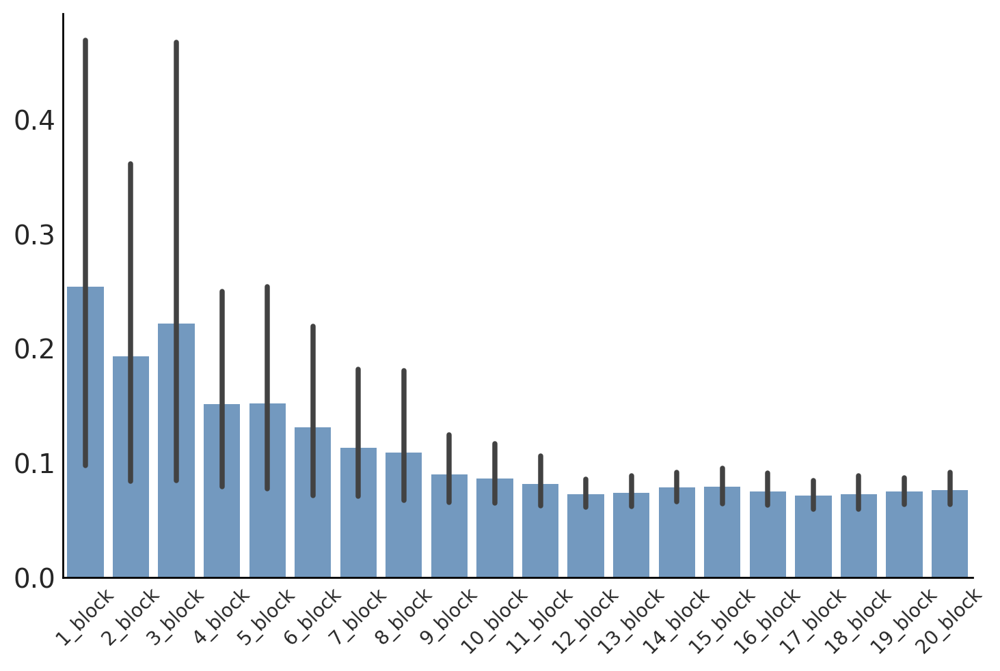

In [14]:
maxsubj = 32 ;maxblock = 20 ;maxtrial = 50

# Since we don't use the first trial for each block, we need to shift the data by 1

Averaged_Accuracy = {f"{i}_block": [] for i in range(1, maxblock + 1)}
Averaged_Contrast = {f"{i}_block": [] for i in range(1, maxblock + 1)} # normalized contrast

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    for iB in range(1, maxblock + 1):
        block_data = subject_data[iB - 1] # Get data for the current block
        block_contrast = block_data.iloc[0:49, :]['ContrastSeq'].values
        block_accuracy = block_data.iloc[1:, :]['Accuracy'].values
        Averaged_Accuracy[f"{iB}_block"].append(np.mean(block_accuracy))
        Averaged_Contrast[f"{iB}_block"].append(np.mean(block_contrast))
        
Averaged_Contrast = pd.DataFrame(Averaged_Contrast)
sns.barplot(data=Averaged_Contrast, color=grb)
plt.xticks(rotation = 45, fontsize = 10)

plt.show()



Due to the original setup in the coding, the Contrast in the ContrastSeq is actually contrast_next, which means we had to move shift all the data with 1 step.

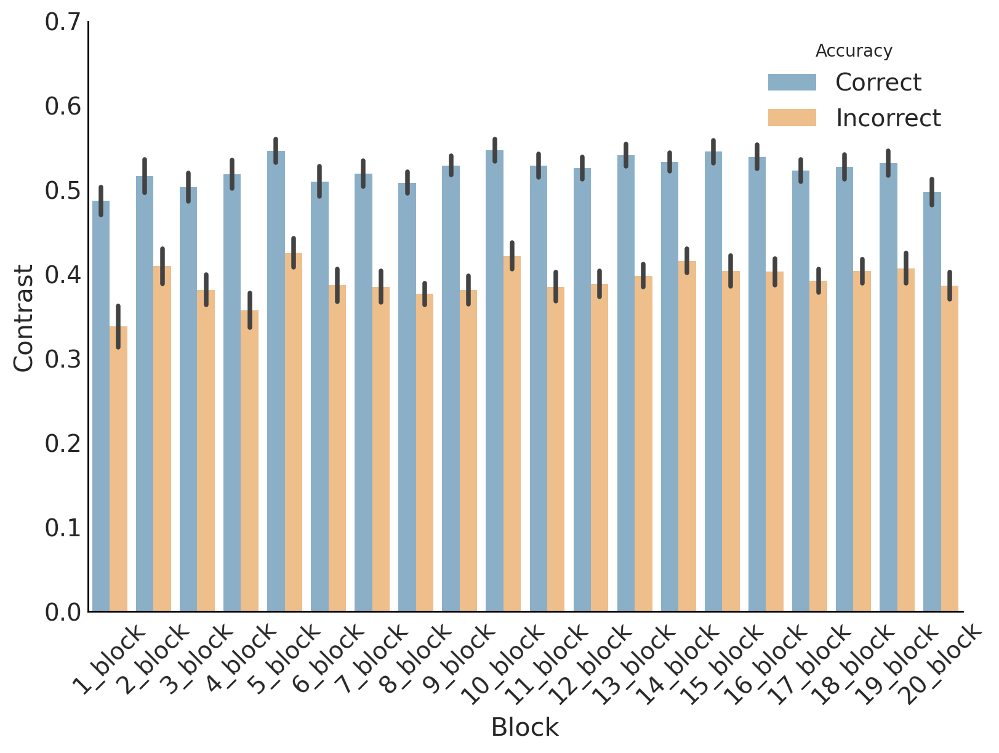

In [15]:
maxsubj = 32 ;maxblock = 20 ;maxtrial = 50

def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

Contrast_at_Correct = {f"{i}_block": [] for i in range(1, maxblock + 1)}
Contrast_at_Incorrect = {f"{i}_block": [] for i in range(1, maxblock + 1)}

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    for iB in range(1, maxblock + 1):
        block_data = subject_data[iB - 1].copy() # Get data for the current block
        block_data['ContrastSeq'] = block_data['ContrastSeq'].shift(1)
        # Since we don't use the first trial for each block, we need to shift the data by 1
        block_data = block_data.iloc[1:, :]
        block_data['ContrastSeq'] = normalize(block_data['ContrastSeq'])
        Contrast_at_Correct[f"{iB}_block"].append(np.mean(block_data[(block_data['Accuracy'] == 1) & (block_data['Qualified'] == True)]['ContrastSeq']))
        Contrast_at_Incorrect[f"{iB}_block"].append(np.mean(block_data[(block_data['Accuracy'] == 0) & (block_data['Qualified'] == True)]['ContrastSeq']))
        
Contrast_at_Correct = pd.DataFrame(Contrast_at_Correct)
Contrast_at_Correct['Subjects'] = np.arange(1, 33)
Contrast_at_Correct['Accuracy'] = 'Correct'
Contrast_at_Incorrect = pd.DataFrame(Contrast_at_Incorrect)
Contrast_at_Incorrect['Subjects'] = np.arange(1, 33)
Contrast_at_Incorrect['Accuracy'] = 'Incorrect'
Contrasts_at = pd.concat([Contrast_at_Correct, Contrast_at_Incorrect])
Contrasts_at = Contrasts_at.melt(id_vars=['Subjects', 'Accuracy'], var_name='Block', value_name='Contrast')

plt.figure(figsize=(8,6))
sns.barplot(x='Block', y='Contrast', hue='Accuracy', data=Contrasts_at, errorbar='se', palette = [bl, ye])
plt.xticks(rotation = 45)
plt.ylim(0, 0.7)
plt.legend(loc='upper right', title = 'Accuracy')
plt.show()

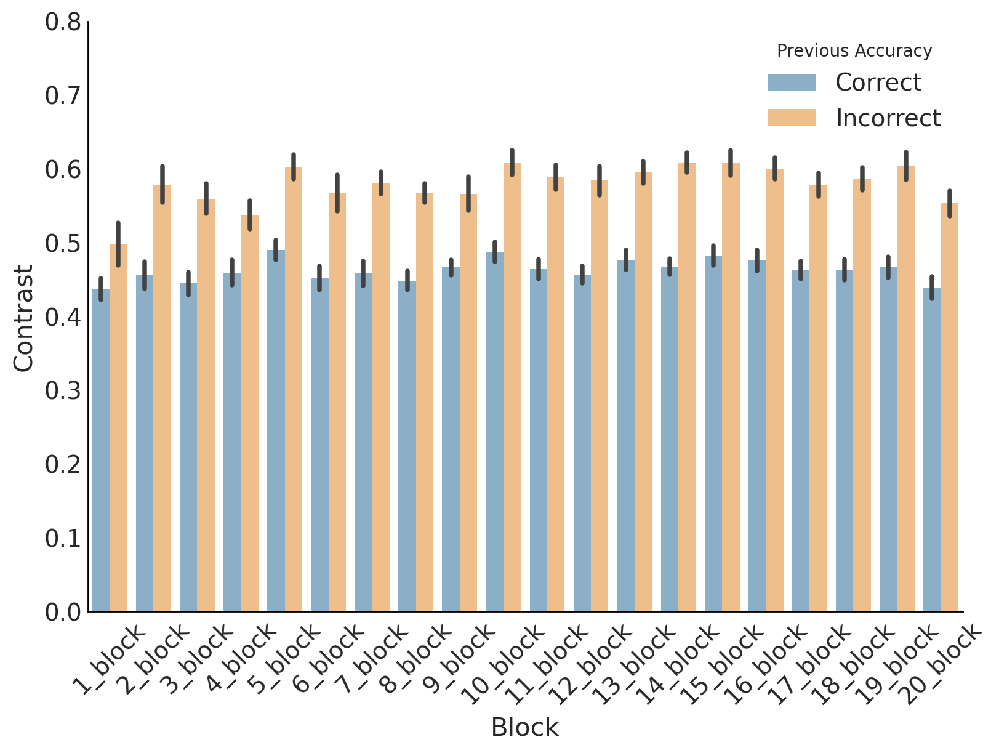

In [16]:

maxsubj = 32 ;maxblock = 20 ;maxtrial = 50

def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

Contrast_after_Correct = {f"{i}_block": [] for i in range(1, maxblock + 1)}
Contrast_after_Incorrect = {f"{i}_block": [] for i in range(1, maxblock + 1)}

for iS in range(1, maxsubj+1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    for iB in range(1, maxblock + 1):
        block_data = subject_data[iB - 1].copy() # Get data for the current block
        block_data['ContrastSeq'] = block_data['ContrastSeq'].shift(1)
        # Since we don't use the first trial for each block, we need to shift the data by 1
        # block_data = block_data.iloc[1:, :]
        block_data['ContrastSeq'] = normalize(block_data['ContrastSeq'])
        Contrast_after_Correct[f"{iB}_block"].append(np.mean(block_data[(block_data['Accuracy'].shift(1) == 1) & (block_data['Qualified'] == True)]['ContrastSeq']))
        Contrast_after_Incorrect[f"{iB}_block"].append(np.mean(block_data[(block_data['Accuracy'].shift(1) == 0) & (block_data['Qualified'] == True)]['ContrastSeq']))

Contrast_after_Correct = pd.DataFrame(Contrast_after_Correct)
Contrast_after_Correct['Subjects'] = np.arange(1, 33)
Contrast_after_Correct['Prev_Accuracy'] = 'Correct'
Contrast_after_Incorrect = pd.DataFrame(Contrast_after_Incorrect)
Contrast_after_Incorrect['Subjects'] = np.arange(1, 33)
Contrast_after_Incorrect['Prev_Accuracy'] = 'Incorrect'
Contrast_after = pd.concat([Contrast_after_Correct, Contrast_after_Incorrect])
Contrast_after = Contrast_after.melt(id_vars=['Subjects', 'Prev_Accuracy'], var_name='Block', value_name='Contrast')

plt.figure(figsize=(8,6))
sns.barplot(x='Block', y='Contrast', hue='Prev_Accuracy', data=Contrast_after, errorbar='se', palette = [bl, ye])
plt.xticks(rotation = 45)
plt.ylim(0, 0.8)
plt.legend(loc='upper right', title= 'Previous Accuracy')
plt.show()


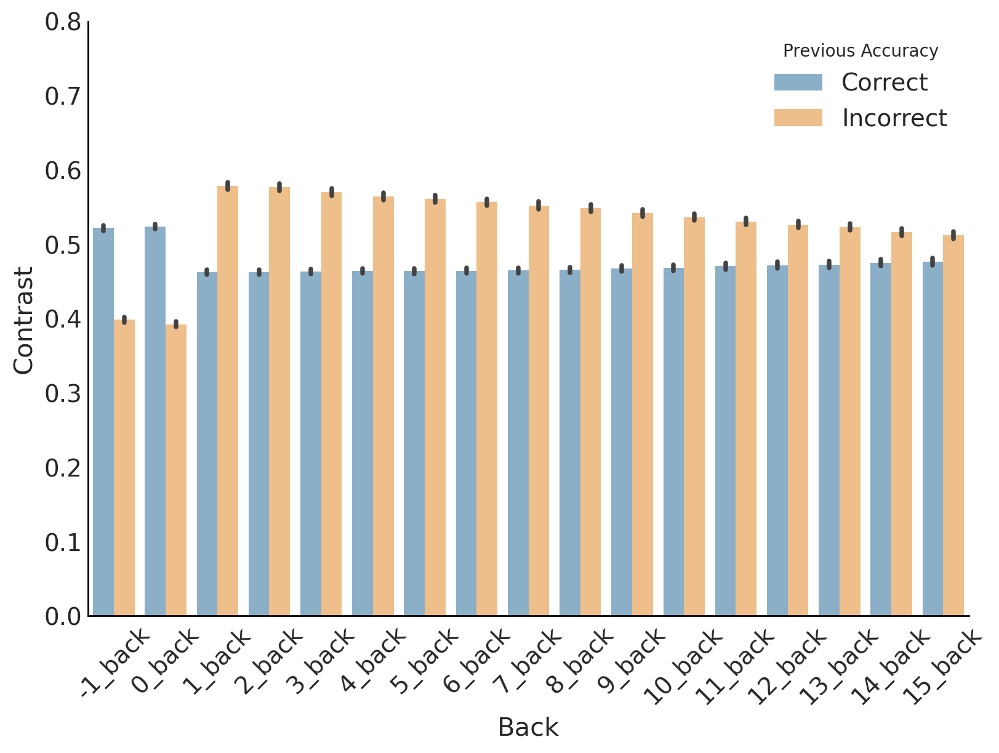

In [17]:

maxsubj = 32 ;maxblock = 20 ;maxtrial = 50; back = 15;

def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

Contrast_after_Correct_back = {f"{i}_back": [] for i in range(-1, back + 1)}
Contrast_after_Incorrect_back = {f"{i}_back": [] for i in range(-1, back + 1)}

for iS in range(1, maxsubj+1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    Contrast_after_Correct_i = {f"{i}_back": [] for i in range(-1, back + 1)}
    Contrast_after_Incorrect_i = {f"{i}_back": [] for i in range(-1, back + 1)}
    for iback in range(-1, back + 1):
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1].copy() # Get data for the current block
            block_data['ContrastSeq'] = block_data['ContrastSeq'].shift(1)
            # Since we don't use the first trial for each block, we need to shift the data by 1
            # block_data = block_data.iloc[1:, :]
            block_data['ContrastSeq'] = normalize(block_data['ContrastSeq'])
            Contrast_after_Correct_i[f"{iback}_back"].append(np.nanmean(block_data[(block_data['Accuracy'].shift(iback) == 1) & (block_data['Qualified'] == True)]['ContrastSeq']))
            Contrast_after_Incorrect_i[f"{iback}_back"].append(np.nanmean(block_data[(block_data['Accuracy'].shift(iback) == 0) & (block_data['Qualified'] == True)]['ContrastSeq']))
        Contrast_after_Correct_back[f"{iback}_back"].append(np.nanmean(Contrast_after_Correct_i[f"{iback}_back"]))
        Contrast_after_Incorrect_back[f"{iback}_back"].append(np.nanmean(Contrast_after_Incorrect_i[f"{iback}_back"]))

Contrast_after_Correct_back = pd.DataFrame(Contrast_after_Correct_back)
Contrast_after_Correct_back['Subjects'] = np.arange(1, 33)
Contrast_after_Correct_back['Prev_Accuracy'] = 'Correct'
Contrast_after_Incorrect_back = pd.DataFrame(Contrast_after_Incorrect_back)
Contrast_after_Incorrect_back['Subjects'] = np.arange(1, 33)
Contrast_after_Incorrect_back['Prev_Accuracy'] = 'Incorrect'
Contrast_after_back = pd.concat([Contrast_after_Correct_back, Contrast_after_Incorrect_back])
Contrast_after_back = Contrast_after_back.melt(id_vars=['Subjects', 'Prev_Accuracy'], var_name='Back', value_name='Contrast')

plt.figure(figsize=(8,6))
sns.barplot(x='Back', y='Contrast', hue='Prev_Accuracy', data=Contrast_after_back, errorbar='se', palette = [bl, ye])
plt.xticks(rotation = 45)
plt.ylim(0, 0.8)
plt.legend(loc='upper right', title= 'Previous Accuracy')
plt.show()



In [33]:
with open('./Contrast_Check.pkl', 'wb') as f:
    dill.dump([Averaged_Contrast, Contrasts_at, Contrast_after, Contrast_after_back], f) # dill.dump(obj, file)

# 5 Non-SDT Percentage

Due to limited data points when considering n-back and after wrong choice, a model-free approach is more suitable for calculating SD effects.

So here we chooose to measure SD-effect solely based on the proportion of choices of the target orientation.

which means:
    $$ \text{Bias}_{\text{percept}} = \text{ACC}_{45deg} - \frac{\text{ACC}_{45deg} + \text{ACC}_{-45deg}}{2} $$
    
equals to:
    $$ \text{Bias}_{\text{percept}} = \frac{\text{ACC}_{45deg} - \text{ACC}_{-45deg}}{2} $$
    
currently, positive bias means more 45deg choices, negative bias means more -45deg choices.

using the shift of Bias as the measure of SD effect, i.e.:
    $$ \text{SD}_{\text{percept}} = \text{Bias}_{\text{percept, nback = 45}} - \text{Bias}_{\text{percept, nack = -45}} $$



In [34]:
maxsubj = 32 ;maxblock = 20 ;maxtrial = 50 ;num_backs = 10  # 1-back to 10-back

# Dictionary to store data for different back levels
Bias_shift_after_Y = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response)
Bias_shift_after_N = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response)
Bias_after_Y45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response
Bias_after_Yn45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with correct feedback (correct response
Bias_after_N45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response
Bias_after_Nn45 = {f"{i}_back": [] for i in range(1, num_backs + 1)} # 1-10 back, with incorrect feedback (incorrect response


def bias_data_percept_FB(data, back, feedback):
    """Process data and return hits and false alarms"""
    acc_45_after_45 = data[(data['StimSeq'] == 45) & (data['RespOri'].shift(back) == 45) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)]['Accuracy']
    acc_n45_after_45 = data[(data['StimSeq'] == -45) & (data['RespOri'].shift(back) == 45) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)]['Accuracy']
    acc_45_after_n45 = data[(data['StimSeq']== 45) & (data['RespOri'].shift(back) == -45) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)]['Accuracy']
    acc_n45_after_n45 = data[(data['StimSeq'] == -45) & (data['RespOri'].shift(back) == -45) & (data['Accuracy'].shift(back) == feedback) & (data['Qualified'] == True)]['Accuracy']
    return (acc_45_after_45, acc_n45_after_45, acc_45_after_n45, acc_n45_after_n45)


FB_types = [0,1]  # 1: correct feedback; 0: incorrect feedback

for iS in range(1, maxsubj + 1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    
    # Create a temporary dictionary to store data for each back level
    temp_data_Y = {f"{i}_back": {"Acc_45_after_45": [], "Acc_n45_after_45": [], "Acc_45_after_n45": [], "Acc_n45_after_n45": []} for i in range(1, num_backs + 1)}
    temp_data_N = {f"{i}_back": {"Acc_45_after_45": [], "Acc_n45_after_45": [], "Acc_45_after_n45": [], "Acc_n45_after_n45": []} for i in range(1, num_backs + 1)}
    temp_data = {1: temp_data_Y, 0: temp_data_N}
    
    for iFB in FB_types:
        feedback = iFB
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1] # Get data for the current block
            for back in range(1, num_backs + 1):
                accs =  bias_data_percept_FB(block_data, back, feedback)
                temp_data[feedback][f"{back}_back"]["Acc_45_after_45"].append(accs[0])
                temp_data[feedback][f"{back}_back"]["Acc_n45_after_45"].append(accs[1])
                temp_data[feedback][f"{back}_back"]["Acc_45_after_n45"].append(accs[2])
                temp_data[feedback][f"{back}_back"]["Acc_n45_after_n45"].append(accs[3])

    # Calculate the criterion score for each back level and add it to SD_back_Percept_Y and SD_back_Percept_N
    for iFB in FB_types:
        feedback = iFB
        for back in range(1, num_backs + 1):
            key = f"{back}_back"
            accs_45_after_45_i = np.concatenate(temp_data[feedback][key]["Acc_45_after_45"])
            accs_n45_after_45_i = np.concatenate(temp_data[feedback][key]["Acc_n45_after_45"])
            accs_45_after_n45_i = np.concatenate(temp_data[feedback][key]["Acc_45_after_n45"])
            accs_n45_after_n45_i = np.concatenate(temp_data[feedback][key]["Acc_n45_after_n45"])
            bias_after_45 = (np.mean(accs_45_after_45_i) - np.mean(accs_n45_after_45_i))/2
            bias_after_n45 = (np.mean(accs_45_after_n45_i) - np.mean(accs_n45_after_n45_i))/2
            bias_shift = bias_after_45 - bias_after_n45
            if feedback == 1:
                Bias_shift_after_Y[key].append(bias_shift)
                Bias_after_Y45[key].append(bias_after_45)
                Bias_after_Yn45[key].append(bias_after_n45)
            else:
                Bias_shift_after_N[key].append(bias_shift)
                Bias_after_N45[key].append(bias_after_45)
                Bias_after_Nn45[key].append(bias_after_n45)
    print('done ', end="@")

Bias_shift_after_Y = pd.DataFrame(Bias_shift_after_Y)
Bias_shift_after_N = pd.DataFrame(Bias_shift_after_N)
Bias_after_Y45 = pd.DataFrame(Bias_after_Y45)
Bias_after_Yn45 = pd.DataFrame(Bias_after_Yn45)
Bias_after_N45 = pd.DataFrame(Bias_after_N45)
Bias_after_Nn45 = pd.DataFrame(Bias_after_Nn45)


done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @done @

In [35]:
with open('./Bias_Shift_Perceptual.pkl', 'wb') as f:
    dill.dump([Bias_shift_after_Y, Bias_shift_after_N, Bias_after_Y45, Bias_after_Yn45,
              Bias_after_N45, Bias_after_Nn45 ], f) # dill.dump(obj, file)

# 6 Reaction time Check 

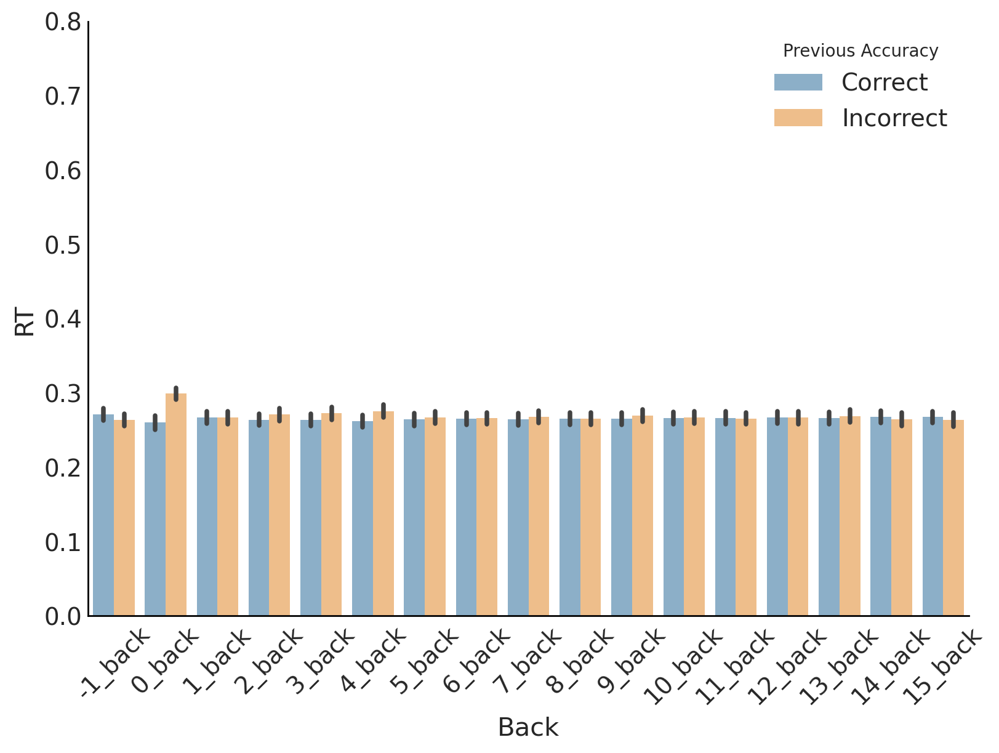

In [37]:

maxsubj = 32 ;maxblock = 20 ;maxtrial = 50; back = 15;

def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

RT_after_Correct_back = {f"{i}_back": [] for i in range(-1, back + 1)}
RT_after_Incorrect_back = {f"{i}_back": [] for i in range(-1, back + 1)}

for iS in range(1, maxsubj+1):
    subject_data = all_data[iS]  # Get all block data for the current subject
    RT_after_Correct_i = {f"{i}_back": [] for i in range(-1, back + 1)}
    RT_after_Incorrect_i = {f"{i}_back": [] for i in range(-1, back + 1)}
    for iback in range(-1, back + 1):
        for iB in range(1, maxblock + 1):
            block_data = subject_data[iB - 1].copy() # Get data for the current block
            # block_data['RT'] = block_data['RT'].shift(1)
            # Since we don't use the first trial for each block, we need to shift the data by 1
            # block_data = block_data.iloc[1:, :]
            block_data['RT'] = normalize(block_data['RT'])
            RT_after_Correct_i[f"{iback}_back"].append(np.nanmean(block_data[(block_data['Accuracy'].shift(iback) == 1) & (block_data['Qualified'] == True)]['RT']))
            RT_after_Incorrect_i[f"{iback}_back"].append(np.nanmean(block_data[(block_data['Accuracy'].shift(iback) == 0) & (block_data['Qualified'] == True)]['RT']))
        RT_after_Correct_back[f"{iback}_back"].append(np.nanmean(RT_after_Correct_i[f"{iback}_back"]))
        RT_after_Incorrect_back[f"{iback}_back"].append(np.nanmean(RT_after_Incorrect_i[f"{iback}_back"]))

RT_after_Correct_back = pd.DataFrame(RT_after_Correct_back)
RT_after_Correct_back['Subjects'] = np.arange(1, 33)
RT_after_Correct_back['Prev_Accuracy'] = 'Correct'
RT_after_Incorrect_back = pd.DataFrame(RT_after_Incorrect_back)
RT_after_Incorrect_back['Subjects'] = np.arange(1, 33)
RT_after_Incorrect_back['Prev_Accuracy'] = 'Incorrect'
RT_after_back = pd.concat([RT_after_Correct_back, RT_after_Incorrect_back])
RT_after_back = RT_after_back.melt(id_vars=['Subjects', 'Prev_Accuracy'], var_name='Back', value_name='RT')





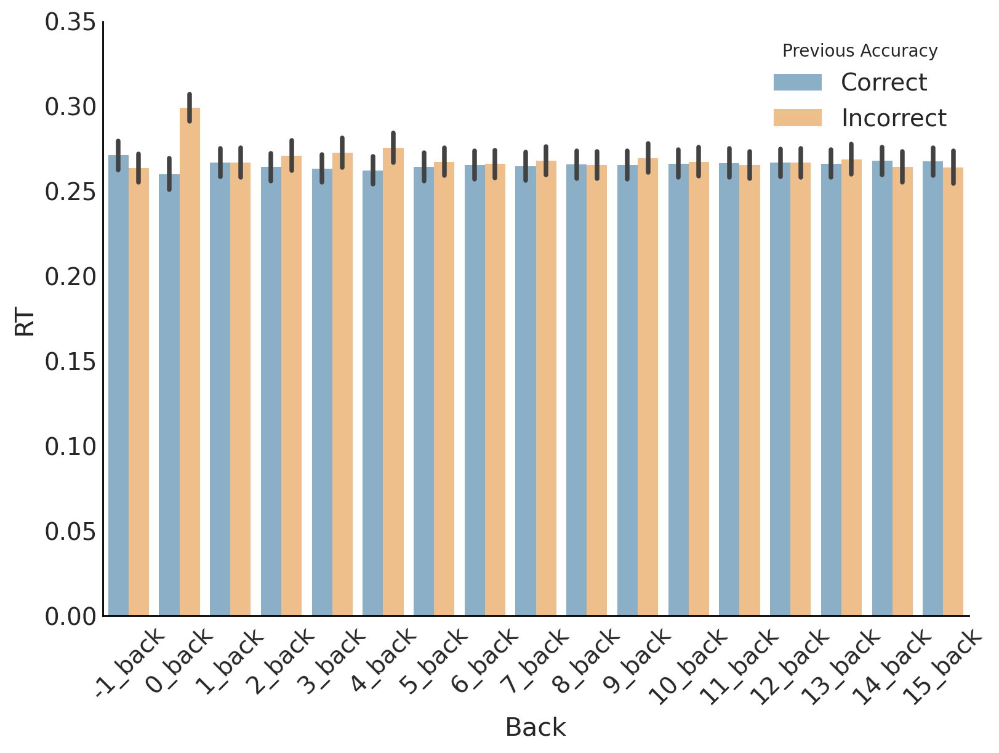

In [39]:
with open('./RT_Check.pkl', 'wb') as f:
    dill.dump(RT_after_back, f) # dill.dump(obj, file)

plt.figure(figsize=(8,6))
plt.ylim(0, 0.35)
sns.barplot(x='Back', y='RT', hue='Prev_Accuracy', data=RT_after_back, errorbar='se', palette = [bl, ye])
plt.xticks(rotation = 45)
plt.legend(loc='upper right', title= 'Previous Accuracy')
plt.show()

# 999 Loading Pre-pocessed Data

In [14]:
import dill

dill.dump_session('SD_1_2.db', ignore=[zmq.backend.cython.socket.Socket])

NameError: name 'zmq' is not defined